# MSc Data Science - Farhan Ahmed Thottathi(THO21545214)

IMPORTING LIBRARIES

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.pipeline import Pipeline
from yellowbrick.regressor import prediction_error, residuals_plot
from sklearn.ensemble import GradientBoostingRegressor



In [2]:
url = 'https://raw.githubusercontent.com/farhan0404/Msc.-Project/main/Motor%20vehicle%20insurance%20data(processed.csv'
data = pd.read_csv(url)
print(data.head())

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<ipython-input-2-fe57e2590a57>:5: DtypeWarning: Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv(url)


,ID,Date_start_contract,Date_last_renewal,Date_next_renewal,Date_birth,Date_driving_licence,Distribution_channel,Seniority,Policies_in_force,Max_policies,...,Area,Second_driver,Year_matriculation,Power,Cylinder_capacity,Value_vehicle,N_doors,Type_fuel,Length,Weight
0,1,05-11-2015,05-11-2015,05-11-2016,15-04-1956,20-03-1976,0,4,1,2,...,0,0,2004,80,599,7068.0,0,P,NaN,190
1,1,05-11-2015,05-11-2016,05-11-2017,15-04-1956,20-03-1976,0,4,1,2,...,0,0,2004,80,599,7068.0,0,P,NaN,190
2,1,05-11-2015,05-11-2017,05-11-2018,15-04-1956,20-03-1976,0,4,2,2,...,0,0,2004,80,599,7068.0,0,P,NaN,190
3,1,05-11-2015,05-11-2018,05-11-2019,15-04-1956,20-03-1976,0,4,2,2,...,0,0,2004,80,599,7068.0,0,P,NaN,190
4,2,26-09-2017,26-09-2017,26-09-2018,15-04-1956,20-03-1976,0,4,2,2,...,0,0,2004,80,599,7068.0,0,P,NaN,190


DATASET TRANSFORMATION PROCESS

In [3]:
import pandas as pd
from datetime import datetime
# Specify the correct date format
data['Date_birth'] = pd.to_datetime(data['Date_birth'], dayfirst=True)
data['Date_last_renewal'] = pd.to_datetime(data['Date_last_renewal'], dayfirst=True)
data['Date_driving_licence'] = pd.to_datetime(data['Date_driving_licence'], dayfirst=True)
# calculating the age at the last renewal date
data['Age'] = data.apply(
    lambda row: row['Date_last_renewal'].year - row['Date_birth'].year -
    ((row['Date_last_renewal'].month, row['Date_last_renewal'].day) <
     (row['Date_birth'].month, row['Date_birth'].day)), axis=1
)


In [4]:
# Now calculate the age at the last renewal date
data['Driving_since'] = data.apply(
    lambda row: row['Date_last_renewal'].year - row['Date_driving_licence'].year -
    ((row['Date_last_renewal'].month, row['Date_last_renewal'].day) <
     (row['Date_driving_licence'].month, row['Date_driving_licence'].day)), axis=1
)

In [5]:
data_new = data.drop(['Date_birth','Date_driving_licence','Date_start_contract'],axis=1)

In [6]:
data_new.head()

,ID,Date_last_renewal,Date_next_renewal,Distribution_channel,Seniority,Policies_in_force,Max_policies,Max_products,Lapse,Date_lapse,...,Year_matriculation,Power,Cylinder_capacity,Value_vehicle,N_doors,Type_fuel,Length,Weight,Age,Driving_since
0,1,2015-11-05,05-11-2016,0,4,1,2,1,0,NaN,...,2004,80,599,7068.0,0,P,NaN,190,59,39
1,1,2016-11-05,05-11-2017,0,4,1,2,1,0,NaN,...,2004,80,599,7068.0,0,P,NaN,190,60,40
2,1,2017-11-05,05-11-2018,0,4,2,2,1,0,NaN,...,2004,80,599,7068.0,0,P,NaN,190,61,41
3,1,2018-11-05,05-11-2019,0,4,2,2,1,0,NaN,...,2004,80,599,7068.0,0,P,NaN,190,62,42
4,2,2017-09-26,26-09-2018,0,4,2,2,1,0,NaN,...,2004,80,599,7068.0,0,P,NaN,190,61,41


In [7]:
data_new.shape

(105555, 29)

In [8]:
data_new['Date_next_renewal'] = pd.to_datetime(data_new['Date_next_renewal'], dayfirst=True)

In [9]:
data_new['Date_lapse'] = pd.to_datetime(data_new['Date_lapse'], dayfirst=True)

In [10]:
data_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105555 entries, 0 to 105554
Data columns (total 29 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   ID                    105555 non-null  int64         
 1   Date_last_renewal     105555 non-null  datetime64[ns]
 2   Date_next_renewal     105555 non-null  datetime64[ns]
 3   Distribution_channel  105555 non-null  object        
 4   Seniority             105555 non-null  int64         
 5   Policies_in_force     105555 non-null  int64         
 6   Max_policies          105555 non-null  int64         
 7   Max_products          105555 non-null  int64         
 8   Lapse                 105555 non-null  int64         
 9   Date_lapse            35147 non-null   datetime64[ns]
 10  Payment               105555 non-null  int64         
 11  Premium               105555 non-null  float64       
 12  Cost_claims_year      105555 non-null  float64       
 13 

In [11]:
data_new.describe()

,ID,Date_last_renewal,Date_next_renewal,Seniority,Policies_in_force,Max_policies,Max_products,Lapse,Date_lapse,Payment,...,Second_driver,Year_matriculation,Power,Cylinder_capacity,Value_vehicle,N_doors,Length,Weight,Age,Driving_since
count,105555.000000,105555,105555,105555.000000,105555.000000,105555.000000,105555.000000,105555.000000,35147,105555.000000,...,105555.000000,105555.000000,105555.000000,105555.000000,105555.000000,105555.000000,95226.000000,105555.000000,105555.000000,105555.000000
mean,26271.286789,2017-06-19 06:14:04.109705728,2018-06-19 08:20:49.077732096,6.696604,1.455649,1.837232,1.065842,0.221837,2017-09-07 05:44:53.521495552,0.319180,...,0.123708,2004.728038,92.682611,1617.759367,18413.657243,4.067898,4.252007,1191.262422,46.827275,24.278045
min,1.000000,2015-11-02 00:00:00,2016-11-02 00:00:00,1.000000,1.000000,1.000000,1.000000,0.000000,2015-11-02 00:00:00,0.000000,...,0.000000,1950.000000,0.000000,49.000000,270.460000,0.000000,1.978000,43.000000,18.000000,-3.000000
25%,12925.000000,2016-09-05 00:00:00,2017-09-05 00:00:00,3.000000,1.000000,1.000000,1.000000,0.000000,2017-02-03 00:00:00,0.000000,...,0.000000,2001.000000,75.000000,1390.000000,13127.210000,3.000000,3.999000,1043.000000,37.000000,14.000000
50%,26082.000000,2017-07-06 00:00:00,2018-07-06 00:00:00,4.000000,1.000000,2.000000,1.000000,0.000000,2017-10-02 00:00:00,0.000000,...,0.000000,2005.000000,90.000000,1598.000000,17608.770000,5.000000,4.230000,1205.000000,46.000000,23.000000
75%,39754.000000,2018-04-06 00:00:00,2019-04-06 00:00:00,9.000000,2.000000,2.000000,1.000000,0.000000,2018-05-19 00:00:00,1.000000,...,0.000000,2008.000000,110.000000,1910.000000,22595.000000,5.000000,4.443000,1388.000000,56.000000,34.000000
max,53502.000000,2018-11-30 00:00:00,2019-11-30 00:00:00,40.000000,17.000000,17.000000,4.000000,7.000000,2019-06-01 00:00:00,1.000000,...,1.000000,2018.000000,580.000000,7480.000000,220675.800000,6.000000,8.218000,7300.000000,98.000000,74.000000
std,15388.309324,NaN,NaN,6.263911,0.928427,1.155536,0.267807,0.464858,NaN,0.466161,...,0.329250,6.767037,37.012645,604.697382,9135.074235,1.511839,0.393220,458.081834,12.839834,12.477684


In [12]:
data_new['Distribution_channel'] = pd.to_numeric(data_new['Distribution_channel'], errors='coerce')

In [13]:
print(data_new.dtypes)

ID                               int64
Date_last_renewal       datetime64[ns]
Date_next_renewal       datetime64[ns]
Distribution_channel           float64
Seniority                        int64
Policies_in_force                int64
Max_policies                     int64
Max_products                     int64
Lapse                            int64
Date_lapse              datetime64[ns]
Payment                          int64
Premium                        float64
Cost_claims_year               float64
N_claims_year                    int64
N_claims_history                 int64
R_Claims_history               float64
Type_risk                        int64
Area                             int64
Second_driver                    int64
Year_matriculation               int64
Power                            int64
Cylinder_capacity                int64
Value_vehicle                  float64
N_doors                          int64
Type_fuel                       object
Length                   

To visulaize in a heat map create a dataset

In [14]:
data_for_corr = data_new.drop(['Date_last_renewal','Date_next_renewal','Date_lapse'],axis =1)
data_for_corr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105555 entries, 0 to 105554
Data columns (total 26 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   ID                    105555 non-null  int64  
 1   Distribution_channel  102139 non-null  float64
 2   Seniority             105555 non-null  int64  
 3   Policies_in_force     105555 non-null  int64  
 4   Max_policies          105555 non-null  int64  
 5   Max_products          105555 non-null  int64  
 6   Lapse                 105555 non-null  int64  
 7   Payment               105555 non-null  int64  
 8   Premium               105555 non-null  float64
 9   Cost_claims_year      105555 non-null  float64
 10  N_claims_year         105555 non-null  int64  
 11  N_claims_history      105555 non-null  int64  
 12  R_Claims_history      105555 non-null  float64
 13  Type_risk             105555 non-null  int64  
 14  Area                  105555 non-null  int64  
 15  

In [15]:
data_for_corr = data_for_corr.drop(['Type_fuel'],axis=1)

In [16]:
correlation_matrix = data_for_corr.corr()

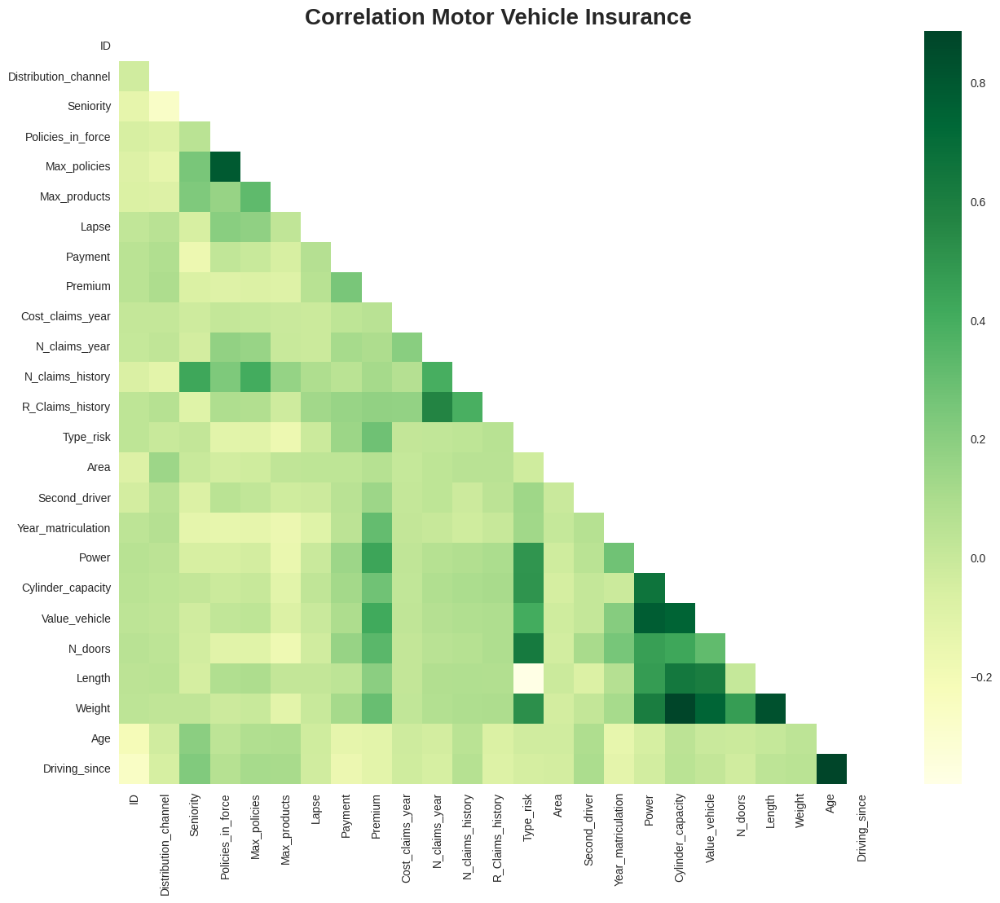

In [17]:
# mask to just show half of the map for more visualisation
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Set up the matplotlib figure
plt.figure(figsize=(15, 12))

# Draw the heatmap with the mask, without grid lines
sns.heatmap(correlation_matrix, mask=mask, annot=False, cmap='YlGn', cbar=True, linewidths=0)
# Remove the grid lines
plt.grid(False)
# Add a title to the heatmap
plt.title('Correlation Motor Vehicle Insurance', fontsize=20, fontweight='bold')
# Display the heatmap
plt.show()

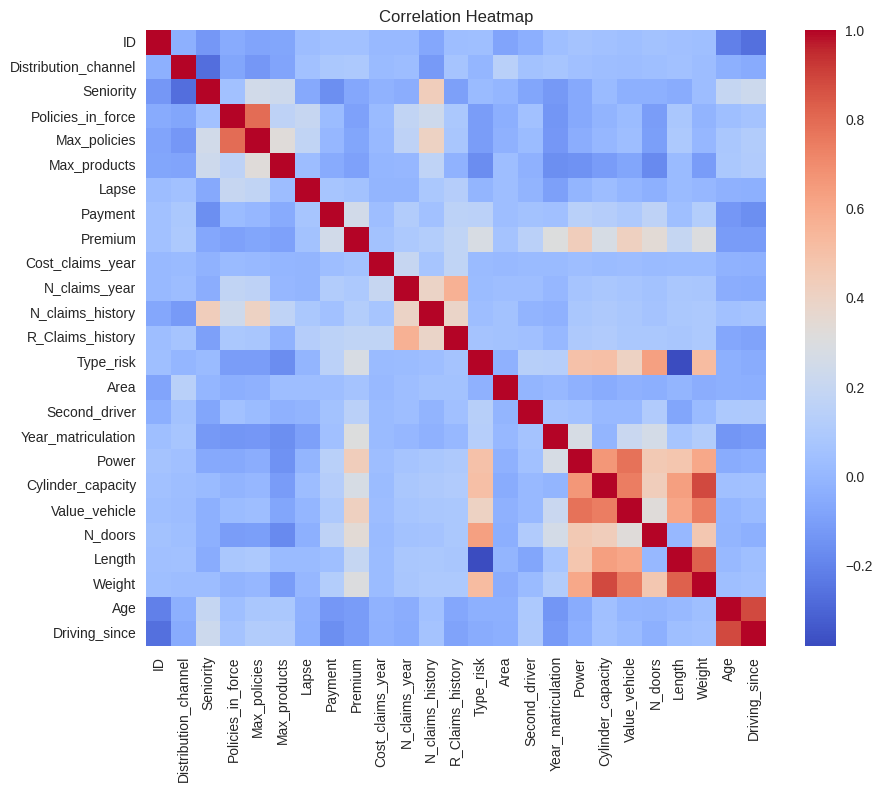

In [18]:
plt.figure(figsize=(10, 8))  # Set the figure size (optional)
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', cbar=True)
plt.title('Correlation Heatmap')  # Add a title to the heatmap
plt.show()


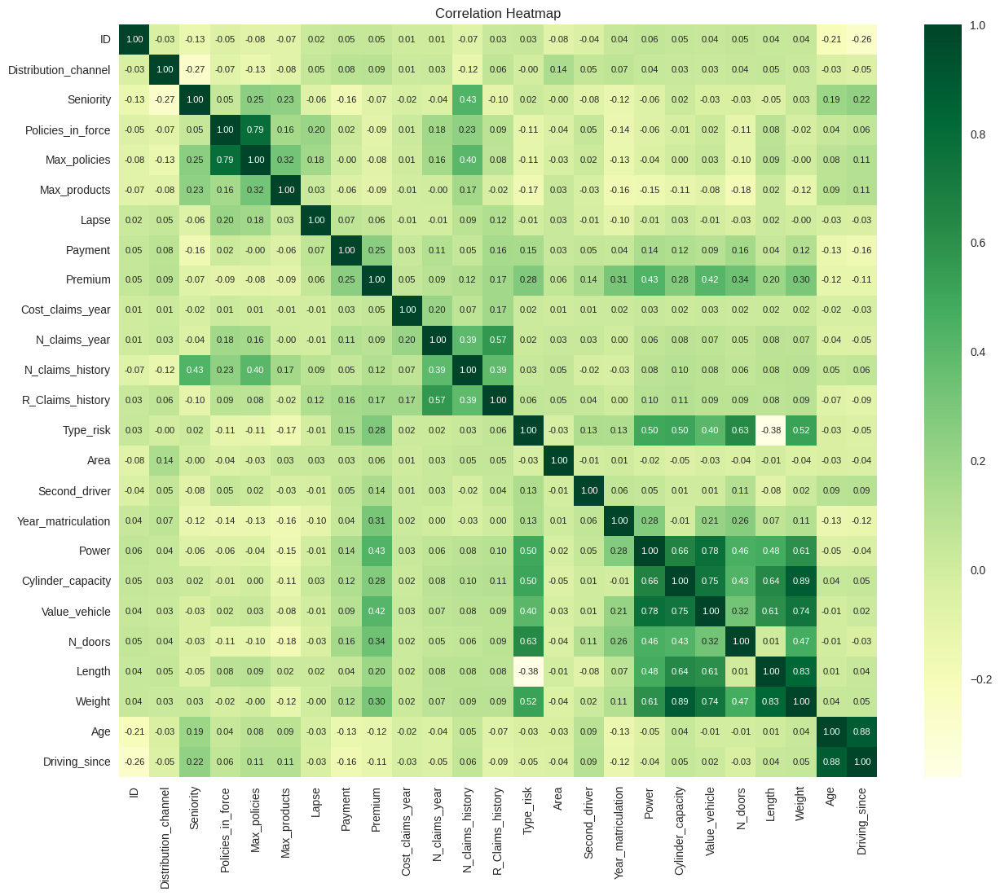

In [19]:
plt.figure(figsize=(15,12))  # Adjust the figure size as necessary
sns.heatmap(correlation_matrix, annot=True, cmap='YlGn', cbar=True, linewidths=0, fmt=".2f", annot_kws={"size": 8})
plt.title('Correlation Heatmap')  # Optional: add a title
plt.show()


Premium Price against Age

Text(0.5, 1.0, 'Insurance Premium Price by Age')

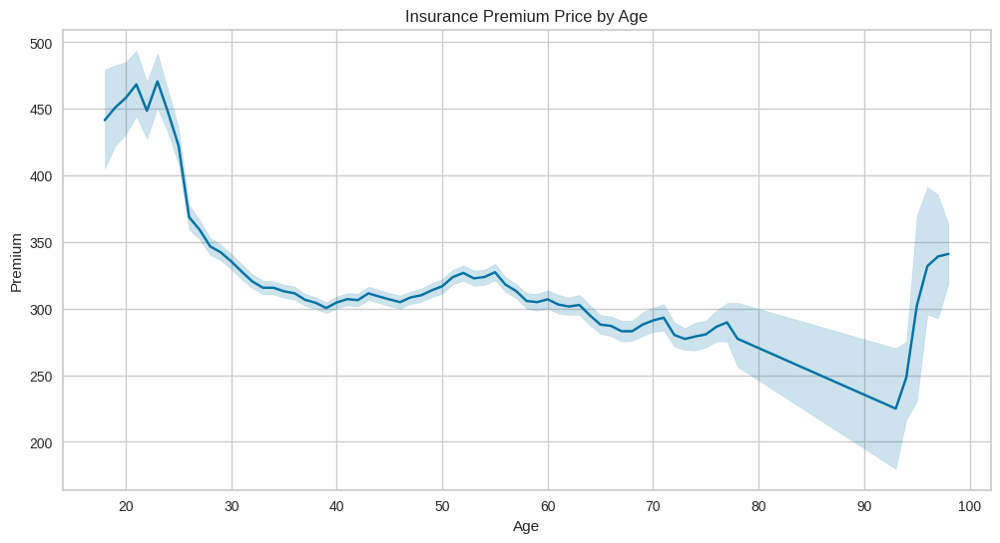

In [20]:
fig,ax=plt.subplots(figsize=(12,6))
sns.lineplot(x=data_new.Age,y=data_new.Premium).set_title('Insurance Premium Price by Age')


In [21]:
#create a bin to plot age distribution in your data
pr_lab=['Low','Basic','Average','High','SuperHigh']
data_new['PremiumLabel']=pr_bins=pd.cut(data_new['Premium'],bins=5,labels=pr_lab,precision=0)

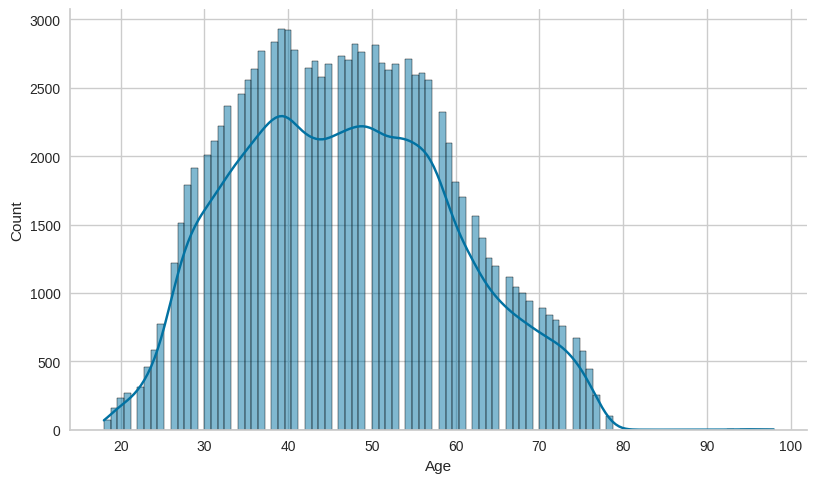

In [22]:
#Plot the age distribution in the dataset
sns.displot(x='Age',data=data_new,aspect=10/6,kde=True)

Text(0.5, 1.0, 'Distribution of the Insurance Premium Price')

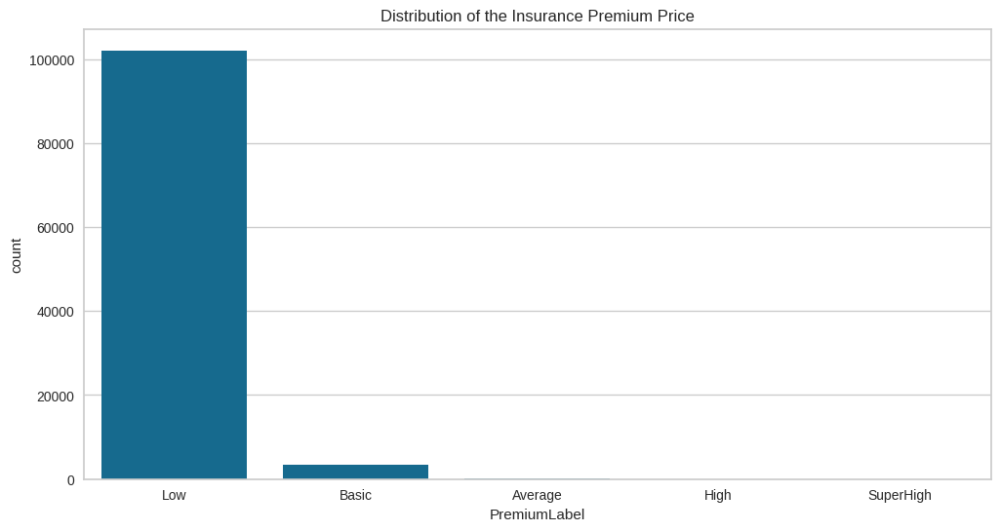

In [23]:
#using the same Bin for Age distribution plot a bar chart
fig,ax=plt.subplots(figsize=(12,6))
sns.countplot(x='PremiumLabel', data=data_new,ax=ax).set_title('Distribution of the Insurance Premium Price')

In [24]:
# Premium label Area and count
data_new.groupby(['PremiumLabel','Area'])['Area'].count()

PremiumLabel  Area
Low           0       74334
              1       27703
Basic         0        2234
              1        1160
Average       0          71
              1          42
High          0           2
              1           6
SuperHigh     0           3
              1           0
Name: Area, dtype: int64

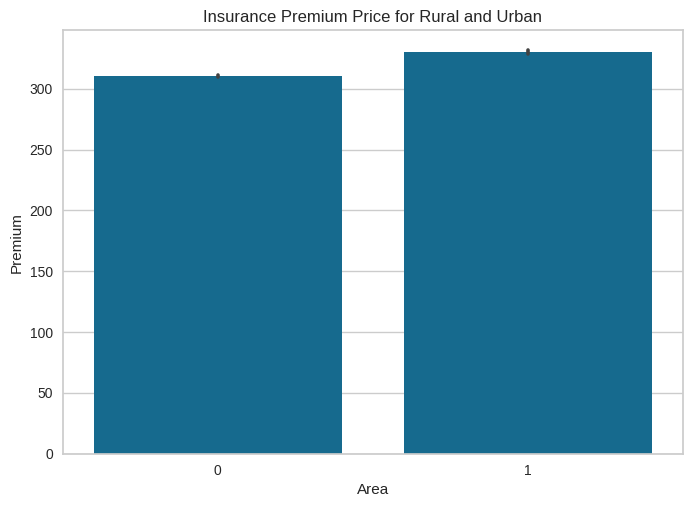

In [25]:
plot = sns.barplot(data=data_new, x="Area", y= "Premium" ).set_title('Insurance Premium Price for Rural and Urban')

Plot age density based on premium

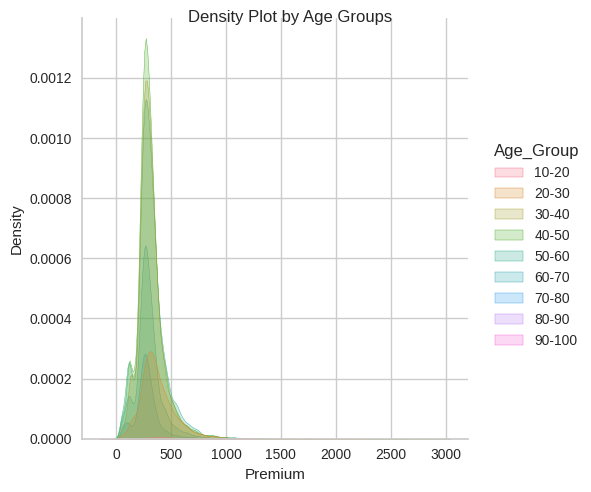

In [26]:
# Create age intervals of 10 years
data_new['Age_Group'] = pd.cut(data_new['Age'], bins=range(10, 110, 10), right=False, labels=[f'{i}-{i+10}' for i in range(10, 100, 10)])

# Now create the KDE plot
plot = sns.displot(data_new, x="Premium", hue="Age_Group", kind="kde", fill=True)

# Adjust the title of the plot
plot.fig.suptitle('Density Plot by Age Groups', fontsize=12, fontdict={"weight": "bold"})

# Show the plot
plt.show()

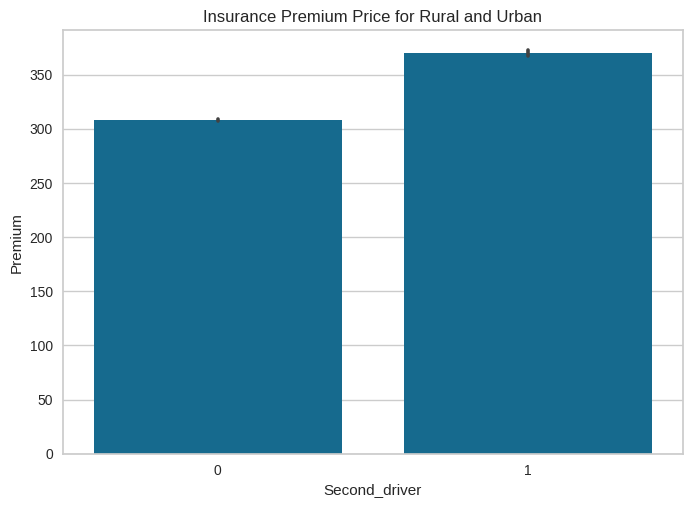

In [27]:
plot = sns.barplot(data=data_new, x="Second_driver", y= "Premium" ).set_title('Insurance Premium Price for Rural and Urban')

Text(0.5, 0.98, 'Density plot Type of fuel')

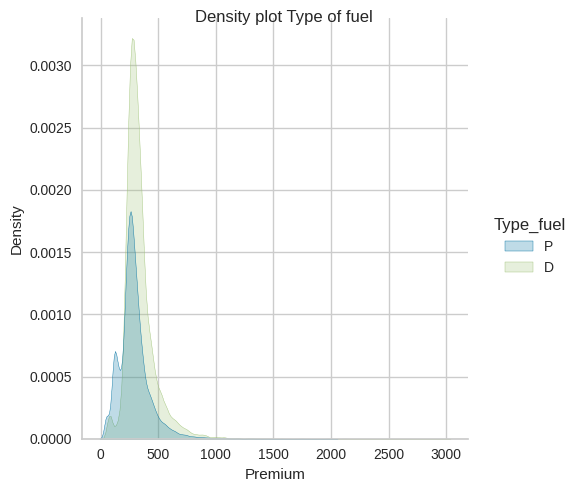

In [28]:
# Plot fuel-density against premium
plot= sns.displot(data_new, x="Premium", hue="Type_fuel", kind="kde", fill=True, )
plot.fig.suptitle('Density plot Type of fuel',
                  fontsize=12, fontdict={"weight": "bold"})

In [29]:
data_new.dtypes


ID                               int64
Date_last_renewal       datetime64[ns]
Date_next_renewal       datetime64[ns]
Distribution_channel           float64
Seniority                        int64
Policies_in_force                int64
Max_policies                     int64
Max_products                     int64
Lapse                            int64
Date_lapse              datetime64[ns]
Payment                          int64
Premium                        float64
Cost_claims_year               float64
N_claims_year                    int64
N_claims_history                 int64
R_Claims_history               float64
Type_risk                        int64
Area                             int64
Second_driver                    int64
Year_matriculation               int64
Power                            int64
Cylinder_capacity                int64
Value_vehicle                  float64
N_doors                          int64
Type_fuel                       object
Length                   

In [30]:
# Now drop the attributes created for plotting
x = data_new.drop(['PremiumLabel','Age_Group'],axis=1)

In [31]:
x.tail()

,ID,Date_last_renewal,Date_next_renewal,Distribution_channel,Seniority,Policies_in_force,Max_policies,Max_products,Lapse,Date_lapse,...,Year_matriculation,Power,Cylinder_capacity,Value_vehicle,N_doors,Type_fuel,Length,Weight,Age,Driving_since
105550,53498,2018-07-30,2019-07-30,0.0,1,1,1,1,0,NaT,...,2000,110,1997,24320.00,5,D,4.740,1480,37,11
105551,53499,2018-08-16,2019-08-16,0.0,1,1,1,1,0,NaT,...,2013,129,1998,30861.97,5,P,4.650,1440,41,0
105552,53500,2018-11-21,2019-11-21,0.0,1,1,1,1,0,NaT,...,1999,55,999,7800.00,5,P,3.495,830,44,7
105553,53501,2018-11-21,2019-11-21,0.0,1,1,1,1,0,NaT,...,2004,90,1753,16610.00,5,D,4.555,1399,72,36
105554,53502,2018-10-01,2019-10-01,1.0,1,1,1,1,0,NaT,...,2010,140,1968,33400.00,5,D,4.854,1699,45,27


In [32]:
x.shape

(105555, 29)

In [33]:
x.dtypes

ID                               int64
Date_last_renewal       datetime64[ns]
Date_next_renewal       datetime64[ns]
Distribution_channel           float64
Seniority                        int64
Policies_in_force                int64
Max_policies                     int64
Max_products                     int64
Lapse                            int64
Date_lapse              datetime64[ns]
Payment                          int64
Premium                        float64
Cost_claims_year               float64
N_claims_year                    int64
N_claims_history                 int64
R_Claims_history               float64
Type_risk                        int64
Area                             int64
Second_driver                    int64
Year_matriculation               int64
Power                            int64
Cylinder_capacity                int64
Value_vehicle                  float64
N_doors                          int64
Type_fuel                       object
Length                   

In [34]:
x['Distribution_channel'].fillna(0, inplace=True)

In [35]:
# To address the missing values
missing_values_count = x.isnull().sum()

# To find only columns that have missing values
columns_with_missing_values = missing_values_count[missing_values_count > 0]

print(columns_with_missing_values)

Date_lapse    70408
Type_fuel      1764
Length        10329
dtype: int64


In [36]:
# To address the missing values in Type_fuel
x['premium_bin'] = x['Premium'].apply(lambda x: round(x,-2))
mode_fuel_per_bin = x.groupby('premium_bin')['Type_fuel'].agg(pd.Series.mode)

def fill_mode(row):
  if pd.isna(row['Type_fuel']):
        return mode_fuel_per_bin.get(row['premium_bin'], np.nan)
  return row['Type_fuel']

x['Type_fuel'] = x.apply(fill_mode, axis=1)

print(x)

           ID Date_last_renewal Date_next_renewal  Distribution_channel  \
0           1        2015-11-05        2016-11-05                   0.0   
1           1        2016-11-05        2017-11-05                   0.0   
2           1        2017-11-05        2018-11-05                   0.0   
3           1        2018-11-05        2019-11-05                   0.0   
4           2        2017-09-26        2018-09-26                   0.0   
...       ...               ...               ...                   ...   
105550  53498        2018-07-30        2019-07-30                   0.0   
105551  53499        2018-08-16        2019-08-16                   0.0   
105552  53500        2018-11-21        2019-11-21                   0.0   
105553  53501        2018-11-21        2019-11-21                   0.0   
105554  53502        2018-10-01        2019-10-01                   1.0   

        Seniority  Policies_in_force  Max_policies  Max_products  Lapse  \
0               4       

In [37]:
missing_values_count = x.isnull().sum()

# To find only columns that have missing values
columns_with_missing_values = missing_values_count[missing_values_count > 0]

print(columns_with_missing_values)

Date_lapse    70408
Length        10329
dtype: int64


In [38]:
# Drop the attribute created in addressing the missing values in Type_fuel
x = x.drop(['premium_bin'],axis=1)

In [39]:
x.dtypes

ID                               int64
Date_last_renewal       datetime64[ns]
Date_next_renewal       datetime64[ns]
Distribution_channel           float64
Seniority                        int64
Policies_in_force                int64
Max_policies                     int64
Max_products                     int64
Lapse                            int64
Date_lapse              datetime64[ns]
Payment                          int64
Premium                        float64
Cost_claims_year               float64
N_claims_year                    int64
N_claims_history                 int64
R_Claims_history               float64
Type_risk                        int64
Area                             int64
Second_driver                    int64
Year_matriculation               int64
Power                            int64
Cylinder_capacity                int64
Value_vehicle                  float64
N_doors                          int64
Type_fuel                       object
Length                   

<function matplotlib.pyplot.show(close=None, block=None)>

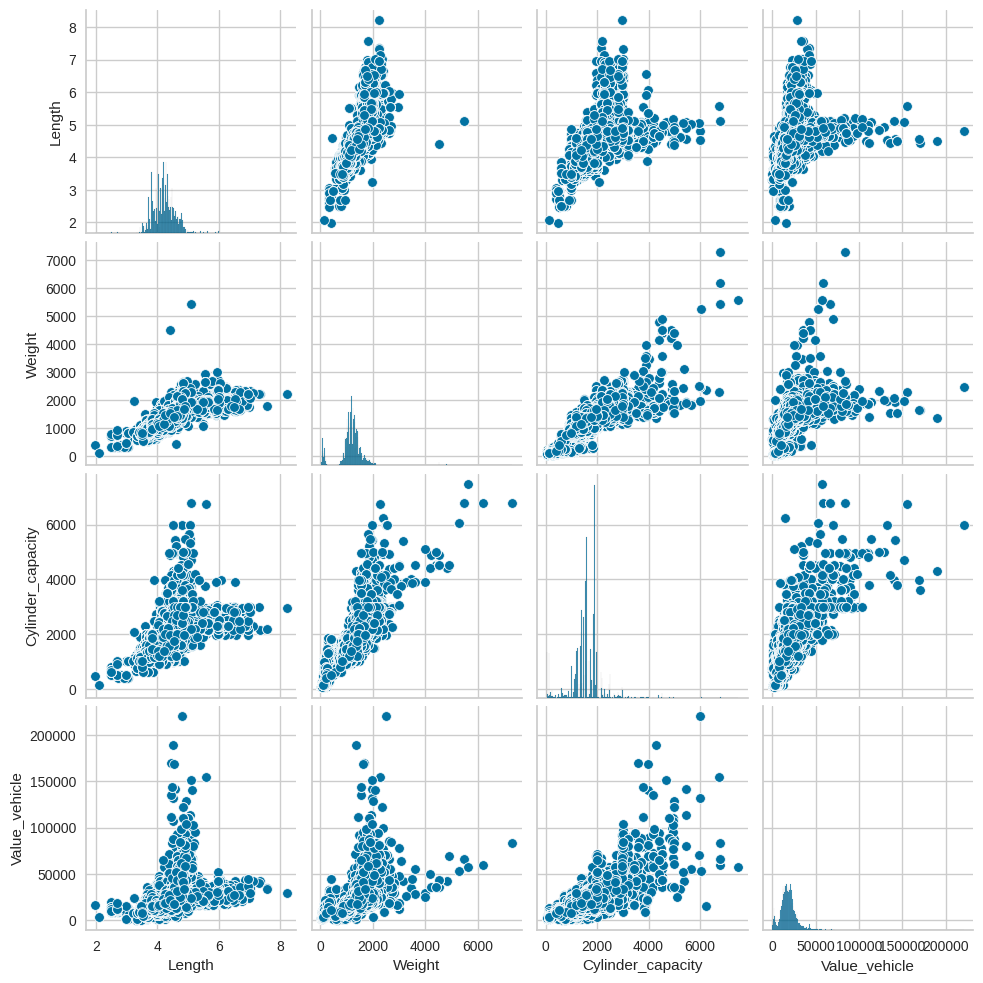

In [40]:
# To address the missing values in legth create a pairplot between length and correlated features
sns.pairplot(data_for_corr,vars=['Length',"Weight","Cylinder_capacity","Value_vehicle"])
plt.show

In [41]:
# As there is a strong correlation between length and Cylinder_capacity, Weight and Value_vehicle we use linear regression model to fill in the missing values in Length.
from sklearn.linear_model import LinearRegression
predictors = ['Weight','Cylinder_capacity','Value_vehicle']
train_data = x[x['Length'].notna()]
predict_data = x[x["Length"].isna()]
regressor = LinearRegression()
regressor.fit(train_data[predictors],train_data['Length'])
predicted_values = regressor.predict(predict_data[predictors])
x.loc[x['Length'].isna(),'Length'] = predicted_values

In [42]:
# Check for missing values in data
missing_values_count = x.isnull().sum()

# To find only columns that have missing values
columns_with_missing_values = missing_values_count[missing_values_count > 0]

print(columns_with_missing_values)

Date_lapse    70408
dtype: int64


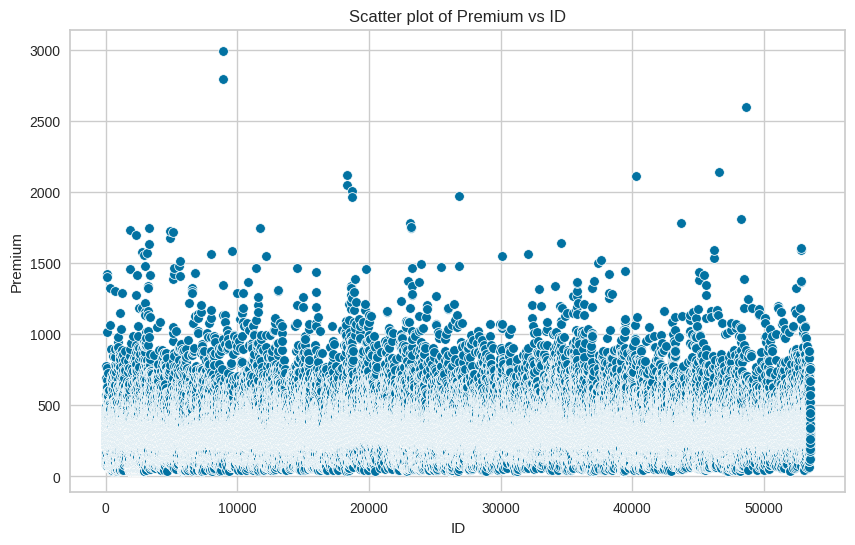

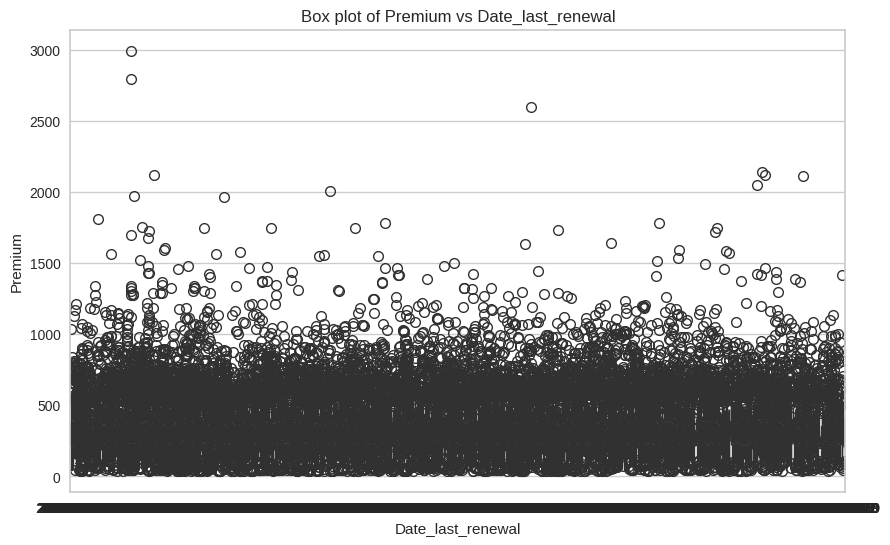

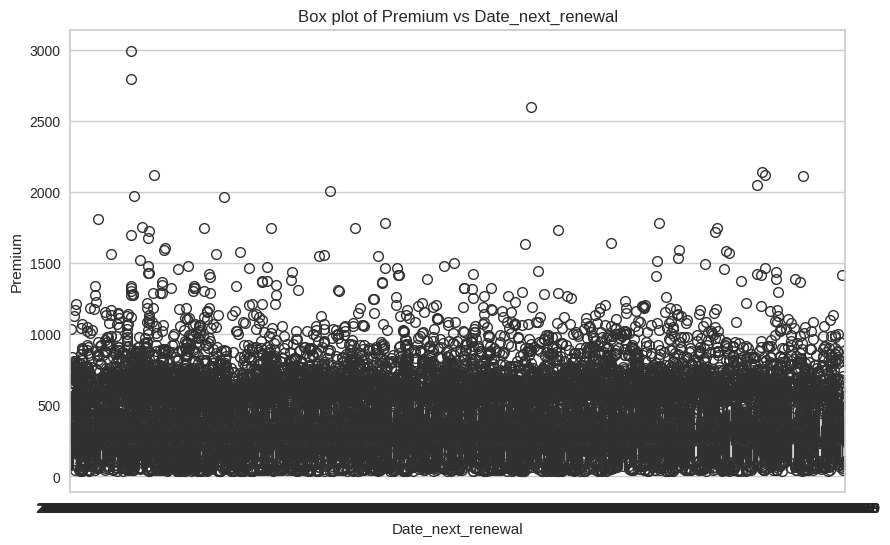

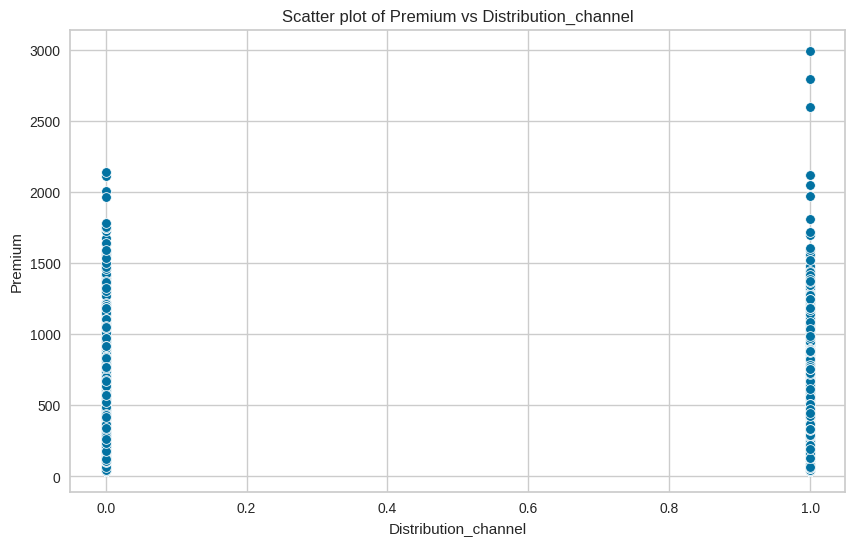

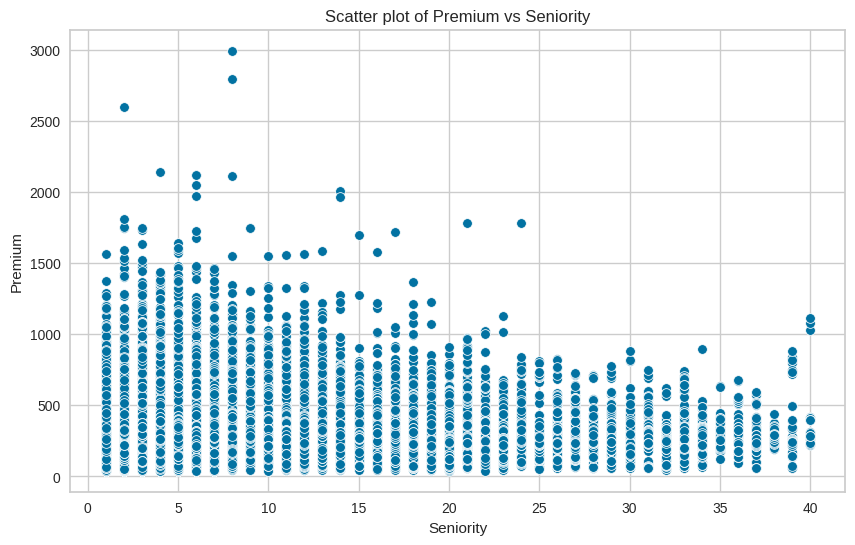

...

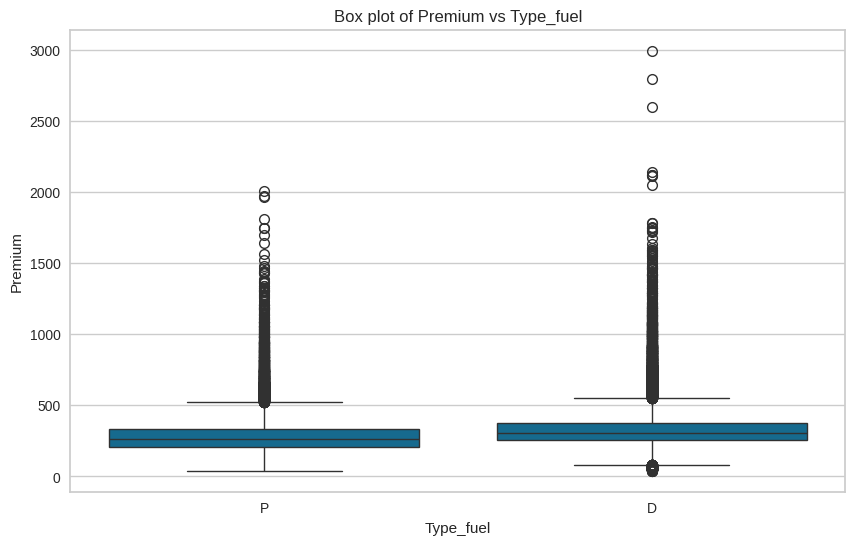

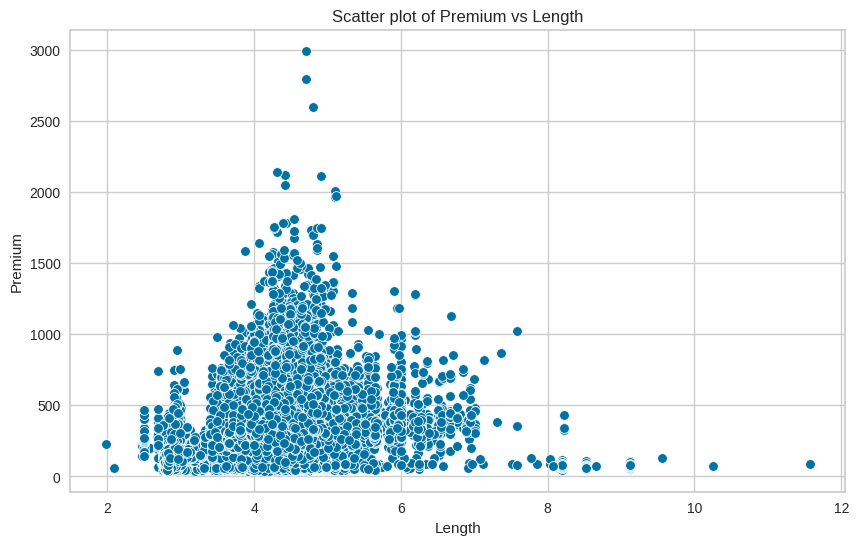

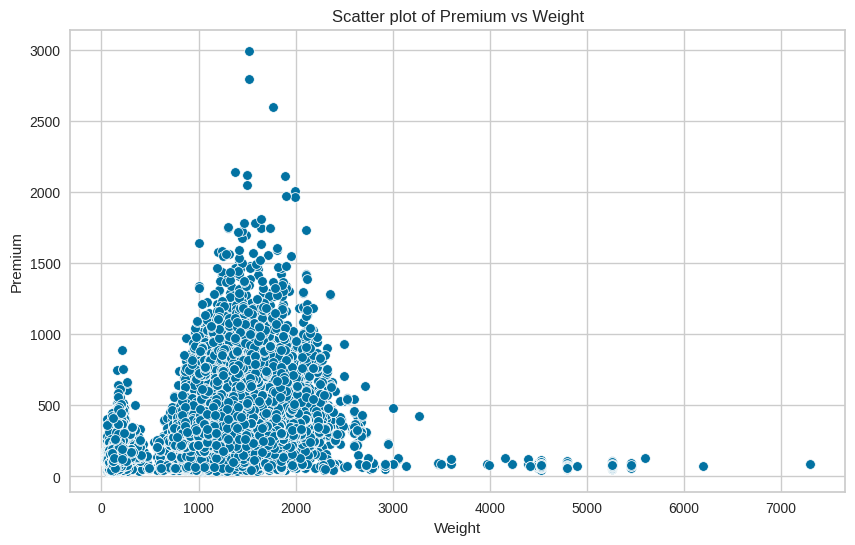

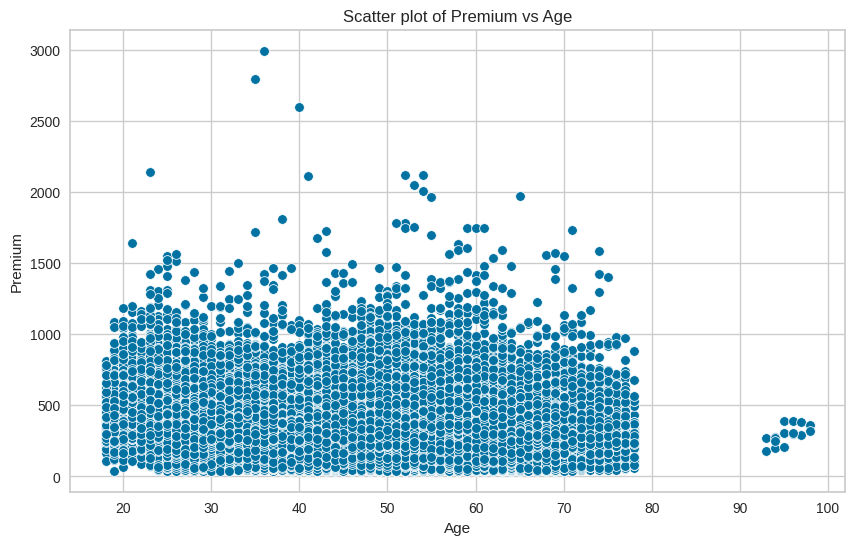

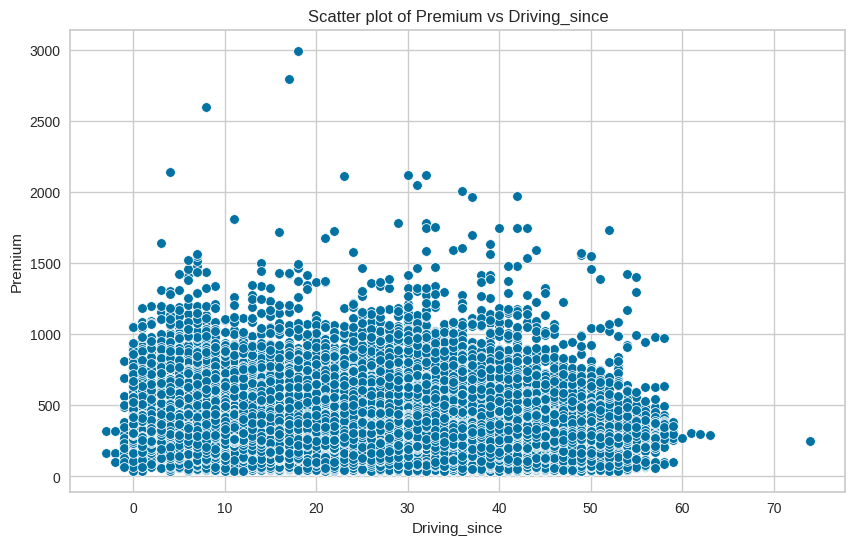

In [43]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



# Define the target variable
target = 'Premium'

# Plotting each feature against 'Premium'
for column in x.columns:
    if column != target:
        plt.figure(figsize=(10, 6))

        if pd.api.types.is_numeric_dtype(x[column]):
            sns.scatterplot(data=x, x=column, y=target)
            plt.title(f'Scatter plot of {target} vs {column}')
        else:
            sns.boxplot(data=x, x=column, y=target)
            plt.title(f'Box plot of {target} vs {column}')

        plt.xlabel(column)
        plt.ylabel(target)
        plt.show()


In [44]:
x.dtypes

ID                               int64
Date_last_renewal       datetime64[ns]
Date_next_renewal       datetime64[ns]
Distribution_channel           float64
Seniority                        int64
Policies_in_force                int64
Max_policies                     int64
Max_products                     int64
Lapse                            int64
Date_lapse              datetime64[ns]
Payment                          int64
Premium                        float64
Cost_claims_year               float64
N_claims_year                    int64
N_claims_history                 int64
R_Claims_history               float64
Type_risk                        int64
Area                             int64
Second_driver                    int64
Year_matriculation               int64
Power                            int64
Cylinder_capacity                int64
Value_vehicle                  float64
N_doors                          int64
Type_fuel                       object
Length                   

In [45]:
# change Type_fuel to numerical values by still mainting the categorical property's
x['Type_fuel'] = x['Type_fuel'].replace({'P': 0, 'D': 1})

# Print the updated DataFrame
print(x)

           ID Date_last_renewal Date_next_renewal  Distribution_channel  \
0           1        2015-11-05        2016-11-05                   0.0   
1           1        2016-11-05        2017-11-05                   0.0   
2           1        2017-11-05        2018-11-05                   0.0   
3           1        2018-11-05        2019-11-05                   0.0   
4           2        2017-09-26        2018-09-26                   0.0   
...       ...               ...               ...                   ...   
105550  53498        2018-07-30        2019-07-30                   0.0   
105551  53499        2018-08-16        2019-08-16                   0.0   
105552  53500        2018-11-21        2019-11-21                   0.0   
105553  53501        2018-11-21        2019-11-21                   0.0   
105554  53502        2018-10-01        2019-10-01                   1.0   

        Seniority  Policies_in_force  Max_policies  Max_products  Lapse  \
0               4       

In [46]:
last = x['Date_last_renewal'].max()
print(last)

2018-11-30 00:00:00


In [47]:
last1 = x['Date_next_renewal'].max()
print(last1)

2019-11-30 00:00:00


In [48]:
last2 = x['Date_lapse'].max()
print(last2)

2019-06-01 00:00:00


In [49]:
# Create a new attribute Lapse_to_next_renewal_days indicating the number of days of lapse till the next renewal date
import numpy as np
x['Lapse_to_next_renewal_days'] = np.where(x['Lapse']==1,(x['Date_lapse'] - x['Date_next_renewal']).dt.days,np.nan)

print(x.head(10))

   ID Date_last_renewal Date_next_renewal  Distribution_channel  Seniority  \
0   1        2015-11-05        2016-11-05                   0.0          4   
1   1        2016-11-05        2017-11-05                   0.0          4   
2   1        2017-11-05        2018-11-05                   0.0          4   
3   1        2018-11-05        2019-11-05                   0.0          4   
4   2        2017-09-26        2018-09-26                   0.0          4   
5   2        2018-09-26        2019-09-26                   0.0          4   
6   3        2015-11-29        2016-11-29                   0.0         15   
7   3        2016-11-29        2017-11-29                   0.0         15   
8   3        2017-11-29        2018-11-29                   0.0         15   
9   3        2018-11-29        2019-11-29                   0.0         15   

   Policies_in_force  Max_policies  Max_products  Lapse Date_lapse  ...  \
0                  1             2             1      0        NaT

In [50]:

print(x.head(25))

    ID Date_last_renewal Date_next_renewal  Distribution_channel  Seniority  \
0    1        2015-11-05        2016-11-05                   0.0          4   
1    1        2016-11-05        2017-11-05                   0.0          4   
2    1        2017-11-05        2018-11-05                   0.0          4   
3    1        2018-11-05        2019-11-05                   0.0          4   
4    2        2017-09-26        2018-09-26                   0.0          4   
5    2        2018-09-26        2019-09-26                   0.0          4   
6    3        2015-11-29        2016-11-29                   0.0         15   
7    3        2016-11-29        2017-11-29                   0.0         15   
8    3        2017-11-29        2018-11-29                   0.0         15   
9    3        2018-11-29        2019-11-29                   0.0         15   
10   4        2016-10-21        2017-10-21                   0.0          3   
11   4        2017-10-21        2018-10-21          

In [51]:
missing_values_count = x.isnull().sum()

# To find only columns that have missing values
columns_with_missing_values = missing_values_count[missing_values_count > 0]

print(columns_with_missing_values)

Date_lapse                    70408
Lapse_to_next_renewal_days    87740
dtype: int64


In [52]:
#insert 0 to missing values in Lapse_to_next_renewal_days
x['Lapse_to_next_renewal_days'].fillna(0, inplace=True)

In [53]:
# drop the Date_lapse attribute from the dataset
x= x.drop(['Date_lapse'],axis=1)

In [54]:
missing_values_count = x.isnull().sum()

# To find only columns that have missing values
columns_with_missing_values = missing_values_count[missing_values_count > 0]

print(columns_with_missing_values)

Series([], dtype: int64)


In [55]:
x.dtypes

ID                                     int64
Date_last_renewal             datetime64[ns]
Date_next_renewal             datetime64[ns]
Distribution_channel                 float64
Seniority                              int64
Policies_in_force                      int64
Max_policies                           int64
Max_products                           int64
Lapse                                  int64
Payment                                int64
Premium                              float64
Cost_claims_year                     float64
N_claims_year                          int64
N_claims_history                       int64
R_Claims_history                     float64
Type_risk                              int64
Area                                   int64
Second_driver                          int64
Year_matriculation                     int64
Power                                  int64
Cylinder_capacity                      int64
Value_vehicle                        float64
N_doors   

In [56]:
# crrete Premium_lag_1 and Premium_lag_2 attributes from Premium to increase prediction power
x= x.sort_values(by=['ID','Date_next_renewal'])
x['Premium_lag_1'] = x.groupby('ID')['Premium'].shift(1)
x['Premium_lag_2'] = x.groupby('ID')['Premium'].shift(2)

x['Premium_lag_1'].fillna(0, inplace=True)
x['Premium_lag_2'].fillna(0, inplace=True)
# Extract Year and Month from renewal_date
x['Year'] = x['Date_next_renewal'].dt.year
x['Month'] = x['Date_next_renewal'].dt.month


In [57]:
missing_values_count = x.isnull().sum()

# To find only columns that have missing values
columns_with_missing_values = missing_values_count[missing_values_count > 0]

print(columns_with_missing_values)

Series([], dtype: int64)


In [58]:
x.dtypes

ID                                     int64
Date_last_renewal             datetime64[ns]
Date_next_renewal             datetime64[ns]
Distribution_channel                 float64
Seniority                              int64
Policies_in_force                      int64
Max_policies                           int64
Max_products                           int64
Lapse                                  int64
Payment                                int64
Premium                              float64
Cost_claims_year                     float64
N_claims_year                          int64
N_claims_history                       int64
R_Claims_history                     float64
Type_risk                              int64
Area                                   int64
Second_driver                          int64
Year_matriculation                     int64
Power                                  int64
Cylinder_capacity                      int64
Value_vehicle                        float64
N_doors   

In [59]:
numerical_features = ['Driving_since','Age','Weight','Length','N_doors','Value_vehicle','Cylinder_capacity','Power','Cost_claims_year','R_Claims_history','N_claims_history','N_claims_year','Max_products','Max_policies','Policies_in_force','Seniority','Premium_lag_1','Premium_lag_2','Lapse_to_next_renewal_days','Premium']

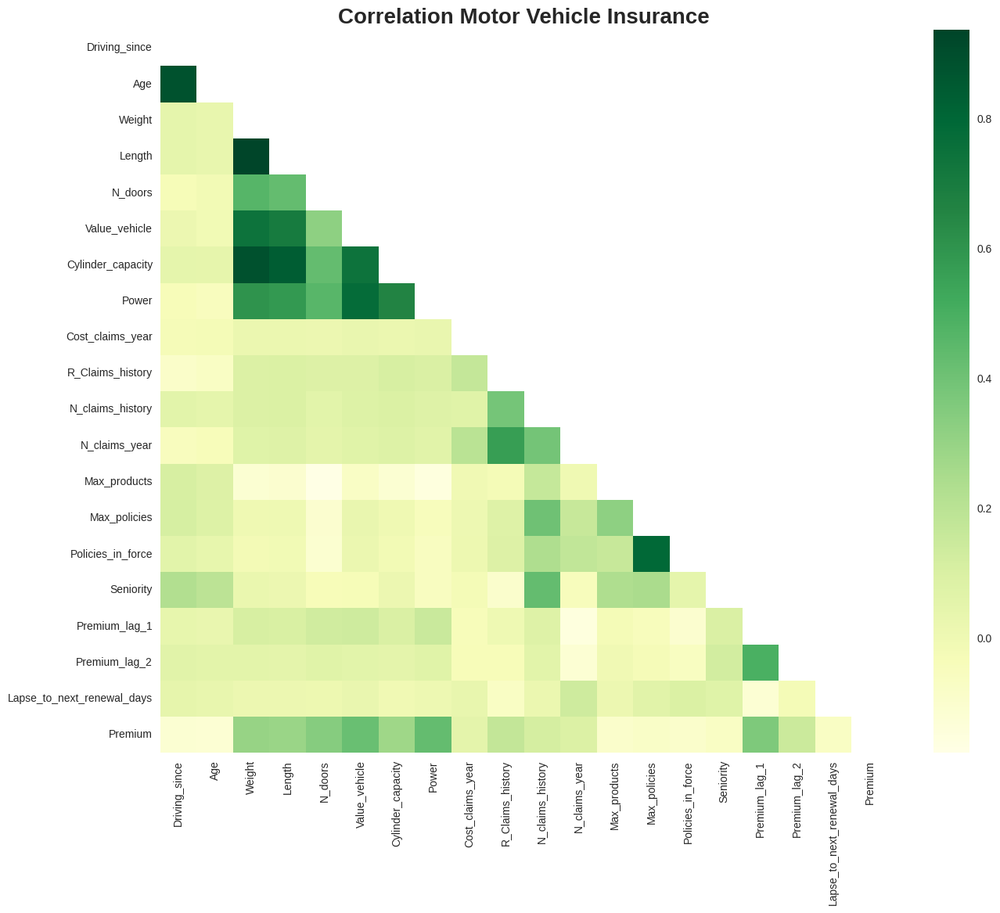

In [60]:
correlation_matrix = x[numerical_features].corr()
# mask to just show half of the map for more visualisation
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Set up the matplotlib figure
plt.figure(figsize=(15, 12))

# Draw the heatmap with the mask, without grid lines
sns.heatmap(correlation_matrix, mask=mask, annot=False, cmap='YlGn', cbar=True, linewidths=0)
# Remove the grid lines
plt.grid(False)
# Add a title to the heatmap
plt.title('Correlation Motor Vehicle Insurance', fontsize=20, fontweight='bold')
# Display the heatmap
plt.show()

In [61]:
x.head()

,ID,Date_last_renewal,Date_next_renewal,Distribution_channel,Seniority,Policies_in_force,Max_policies,Max_products,Lapse,Payment,...,Type_fuel,Length,Weight,Age,Driving_since,Lapse_to_next_renewal_days,Premium_lag_1,Premium_lag_2,Year,Month
0,1,2015-11-05,2016-11-05,0.0,4,1,2,1,0,0,...,0,2.937959,190,59,39,0.0,0.00,0.00,2016,11
1,1,2016-11-05,2017-11-05,0.0,4,1,2,1,0,0,...,0,2.937959,190,60,40,0.0,222.52,0.00,2017,11
2,1,2017-11-05,2018-11-05,0.0,4,2,2,1,0,0,...,0,2.937959,190,61,41,0.0,213.78,222.52,2018,11
3,1,2018-11-05,2019-11-05,0.0,4,2,2,1,0,0,...,0,2.937959,190,62,42,0.0,214.84,213.78,2019,11
4,2,2017-09-26,2018-09-26,0.0,4,2,2,1,0,1,...,0,2.937959,190,61,41,0.0,0.00,0.00,2018,9


In [62]:
x.dtypes

ID                                     int64
Date_last_renewal             datetime64[ns]
Date_next_renewal             datetime64[ns]
Distribution_channel                 float64
Seniority                              int64
Policies_in_force                      int64
Max_policies                           int64
Max_products                           int64
Lapse                                  int64
Payment                                int64
Premium                              float64
Cost_claims_year                     float64
N_claims_year                          int64
N_claims_history                       int64
R_Claims_history                     float64
Type_risk                              int64
Area                                   int64
Second_driver                          int64
Year_matriculation                     int64
Power                                  int64
Cylinder_capacity                      int64
Value_vehicle                        float64
N_doors   

In [63]:
# as Year_matriculation is in YYYY format we create a new attribute  Year_last_renewal which is Date_last_renewal in YYYY format
x['Year_last_renewal'] = pd.to_datetime(x['Date_last_renewal']).dt.year

In [64]:
# Calcualte the vehicle age at the year of policy renewal
x['vehicle_age']= x['Year_last_renewal'] - x['Year_matriculation']

In [65]:
x.dtypes

ID                                     int64
Date_last_renewal             datetime64[ns]
Date_next_renewal             datetime64[ns]
Distribution_channel                 float64
Seniority                              int64
Policies_in_force                      int64
Max_policies                           int64
Max_products                           int64
Lapse                                  int64
Payment                                int64
Premium                              float64
Cost_claims_year                     float64
N_claims_year                          int64
N_claims_history                       int64
R_Claims_history                     float64
Type_risk                              int64
Area                                   int64
Second_driver                          int64
Year_matriculation                     int64
Power                                  int64
Cylinder_capacity                      int64
Value_vehicle                        float64
N_doors   

In [66]:
x.head()

,ID,Date_last_renewal,Date_next_renewal,Distribution_channel,Seniority,Policies_in_force,Max_policies,Max_products,Lapse,Payment,...,Weight,Age,Driving_since,Lapse_to_next_renewal_days,Premium_lag_1,Premium_lag_2,Year,Month,Year_last_renewal,vehicle_age
0,1,2015-11-05,2016-11-05,0.0,4,1,2,1,0,0,...,190,59,39,0.0,0.00,0.00,2016,11,2015,11
1,1,2016-11-05,2017-11-05,0.0,4,1,2,1,0,0,...,190,60,40,0.0,222.52,0.00,2017,11,2016,12
2,1,2017-11-05,2018-11-05,0.0,4,2,2,1,0,0,...,190,61,41,0.0,213.78,222.52,2018,11,2017,13
3,1,2018-11-05,2019-11-05,0.0,4,2,2,1,0,0,...,190,62,42,0.0,214.84,213.78,2019,11,2018,14
4,2,2017-09-26,2018-09-26,0.0,4,2,2,1,0,1,...,190,61,41,0.0,0.00,0.00,2018,9,2017,13


Plot Premium against all the features in the dataset


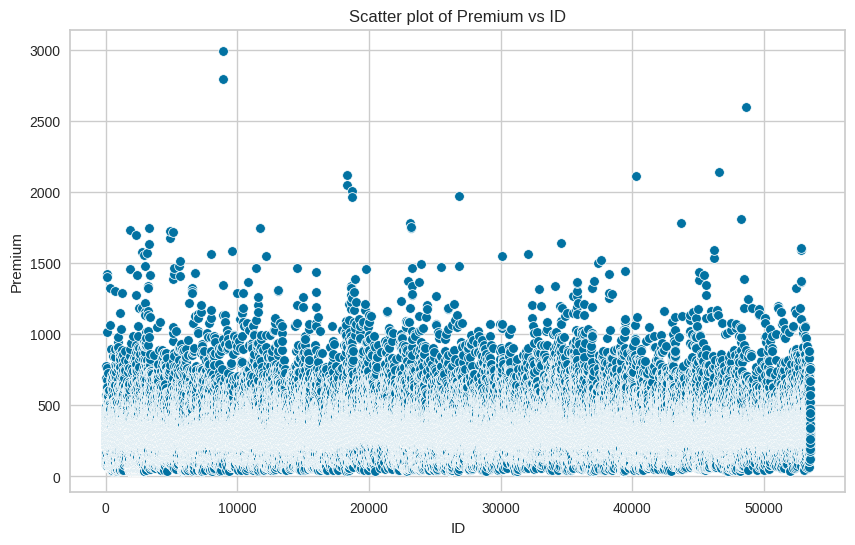

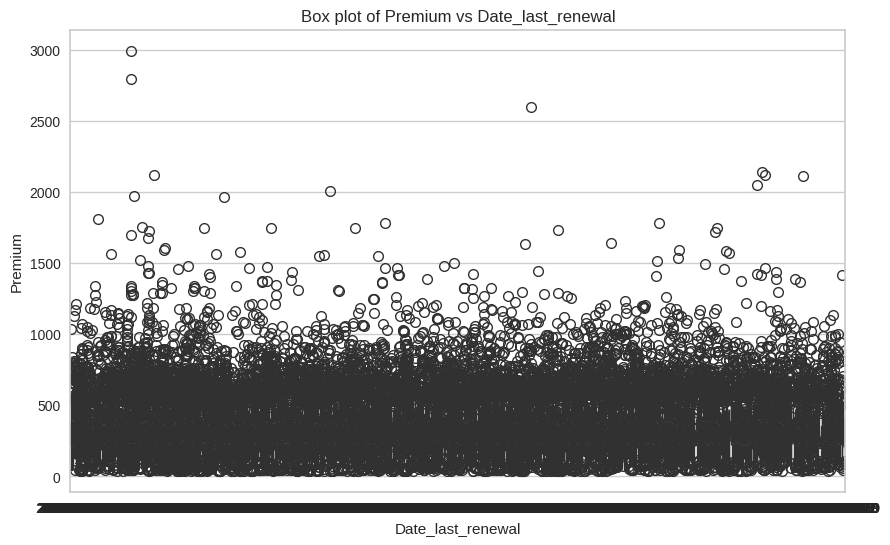

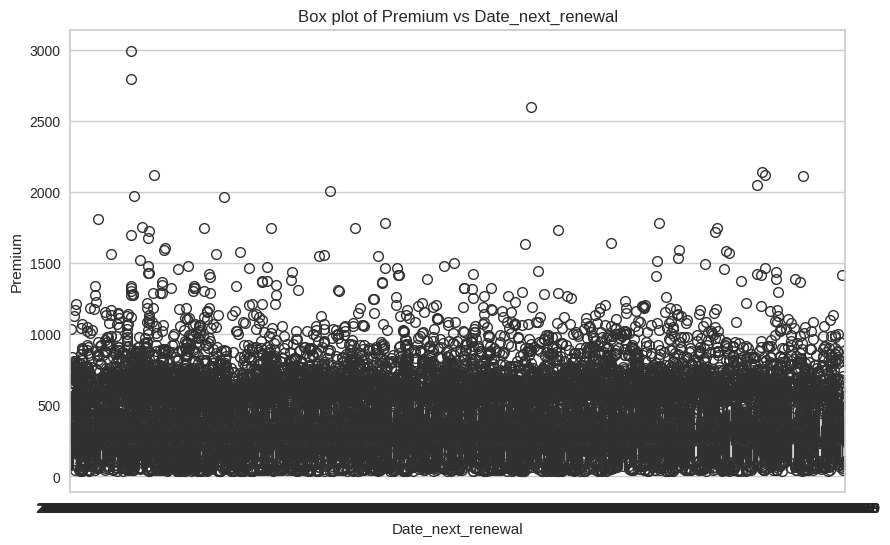

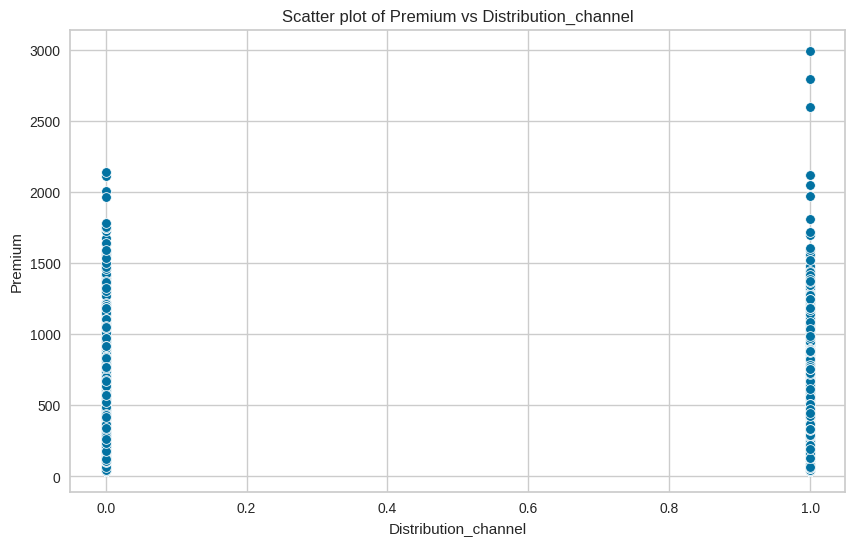

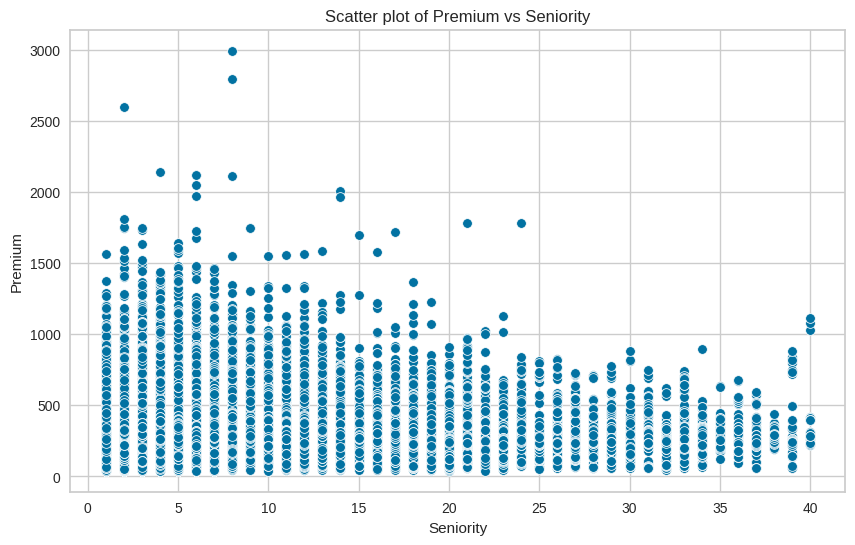

...

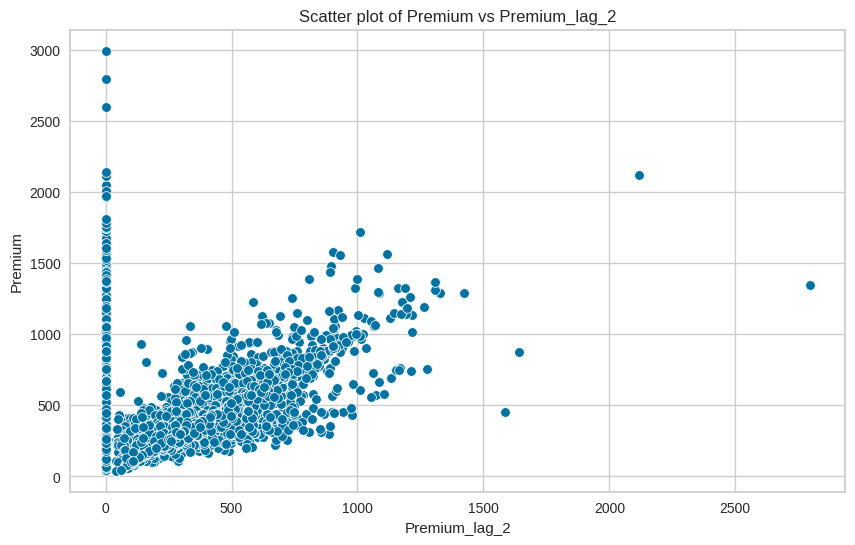

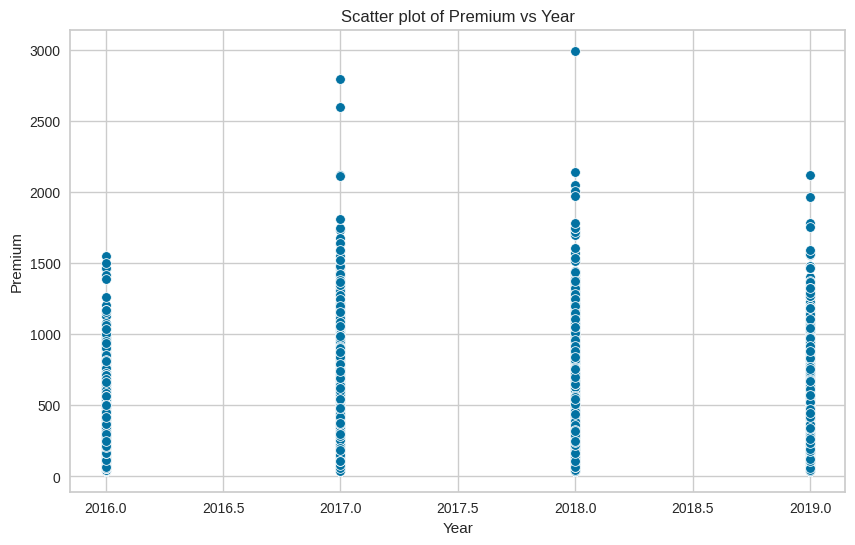

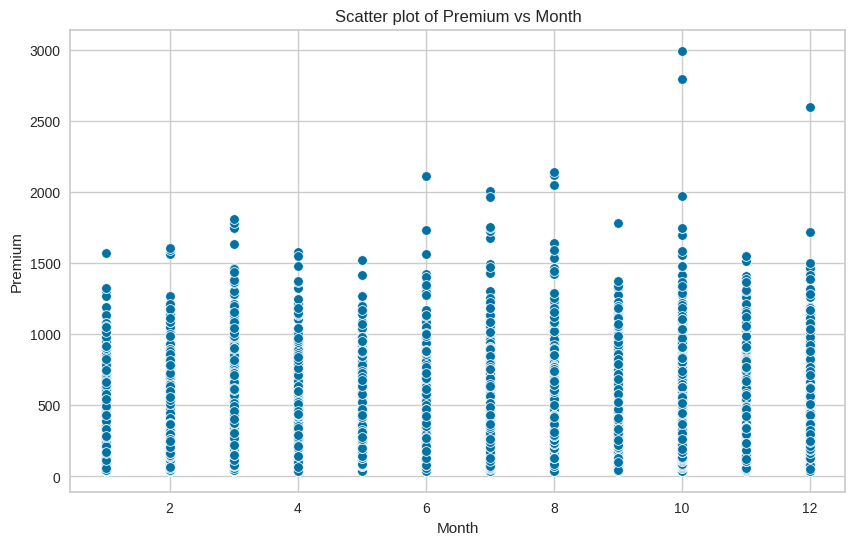

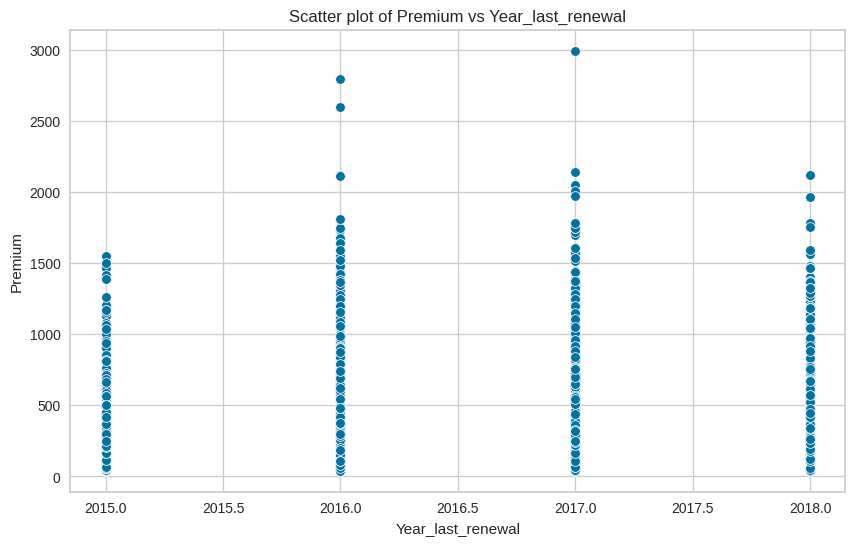

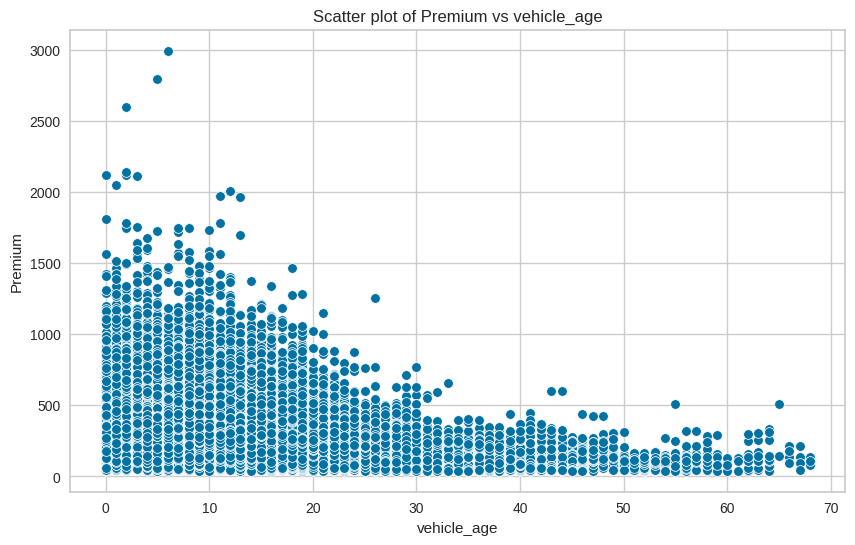

In [67]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



# Define the target variable
target = 'Premium'

# Plotting each feature against 'Premium'
for column in x.columns:
    if column != target:
        plt.figure(figsize=(10, 6))

        if pd.api.types.is_numeric_dtype(x[column]):
            sns.scatterplot(data=x, x=column, y=target)
            plt.title(f'Scatter plot of {target} vs {column}')
        else:
            sns.boxplot(data=x, x=column, y=target)
            plt.title(f'Box plot of {target} vs {column}')

        plt.xlabel(column)
        plt.ylabel(target)
        plt.show()

In [68]:
x.dtypes

ID                                     int64
Date_last_renewal             datetime64[ns]
Date_next_renewal             datetime64[ns]
Distribution_channel                 float64
Seniority                              int64
Policies_in_force                      int64
Max_policies                           int64
Max_products                           int64
Lapse                                  int64
Payment                                int64
Premium                              float64
Cost_claims_year                     float64
N_claims_year                          int64
N_claims_history                       int64
R_Claims_history                     float64
Type_risk                              int64
Area                                   int64
Second_driver                          int64
Year_matriculation                     int64
Power                                  int64
Cylinder_capacity                      int64
Value_vehicle                        float64
N_doors   

## AIM 1: PREDICT INSURANCE PREMIUM


In [69]:
# identify the numerical variables
numerical_features = ['Driving_since','Age','Weight','Length','N_doors','Value_vehicle','Cylinder_capacity','Power','Cost_claims_year','R_Claims_history','N_claims_history','N_claims_year','Max_products','Max_policies','Policies_in_force','Seniority','Premium_lag_1','Premium_lag_2','Lapse_to_next_renewal_days','vehicle_age']

In [70]:
#identify the categorical Variable
categorical_features = ['Type_fuel','Distribution_channel','Second_driver','Type_risk','Payment','Area','Lapse']

In [71]:
# Split the data into Independent X variable and Target Y variable
y=x['Premium']
X=x.drop(['Premium','Date_next_renewal','Date_last_renewal','Year','Month','Year_last_renewal','Year_matriculation'],axis=1)

In [72]:
# Drop ID
X1 = X.drop(['ID'],axis=1)

In [73]:
X1.dtypes

Distribution_channel          float64
Seniority                       int64
Policies_in_force               int64
Max_policies                    int64
Max_products                    int64
Lapse                           int64
Payment                         int64
Cost_claims_year              float64
N_claims_year                   int64
N_claims_history                int64
R_Claims_history              float64
Type_risk                       int64
Area                            int64
Second_driver                   int64
Power                           int64
Cylinder_capacity               int64
Value_vehicle                 float64
N_doors                         int64
Type_fuel                       int64
Length                        float64
Weight                          int64
Age                             int64
Driving_since                   int64
Lapse_to_next_renewal_days    float64
Premium_lag_1                 float64
Premium_lag_2                 float64
vehicle_age 

In [74]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=44, shuffle=True)

In [75]:
# Split the data into train and test for model training and evaluation
X1_train, X1_test, y1train, y1_test = train_test_split(X1, y, test_size=0.2, random_state=44, shuffle=True)

Scale the numerical data in the X1 variable

In [76]:
numerical_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

In [77]:
from sklearn.compose import ColumnTransformer
preprocessor = ColumnTransformer(transformers=[
    ('num', numerical_transformer, numerical_features),
    ('cat', categorical_transformer, categorical_features)
])

In [78]:
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

In [79]:
X1_train = preprocessor.fit_transform(X1_train)
X1_test = preprocessor.transform(X1_test)

Models deployed before outliers where identified and removed

In [80]:
#TensorFlow Model
import tensorflow as tf
model = tf.keras.Sequential([
    tf.keras.layers.Dense(256, activation='relu', input_shape=(X1_train.shape[1],)),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss='mean_squared_error',
              metrics=['mae'])

history = model.fit(X1_train, y1train, epochs=100, batch_size=32, validation_data=(X1_test, y1_test), verbose=2)

# Evaluate the Model
test_loss, test_mae = model.evaluate(X1_test, y1_test, verbose=0)
print(f'Test MAE: {test_mae:.2f}')

Epoch 1/100
2639/2639 - 9s - loss: 10234.4170 - mae: 61.0883 - val_loss: 7240.7705 - val_mae: 49.8295 - 9s/epoch - 4ms/step
Epoch 2/100
2639/2639 - 6s - loss: 7429.1743 - mae: 49.9539 - val_loss: 7017.9590 - val_mae: 49.8917 - 6s/epoch - 2ms/step
Epoch 3/100
2639/2639 - 8s - loss: 7227.2588 - mae: 49.2980 - val_loss: 6770.0479 - val_mae: 48.4072 - 8s/epoch - 3ms/step
Epoch 4/100
2639/2639 - 6s - loss: 7077.9648 - mae: 48.6318 - val_loss: 6881.7324 - val_mae: 48.9633 - 6s/epoch - 2ms/step
Epoch 5/100
2639/2639 - 8s - loss: 6998.4097 - mae: 48.3401 - val_loss: 6600.5713 - val_mae: 46.3622 - 8s/epoch - 3ms/step
Epoch 6/100
2639/2639 - 6s - loss: 6907.8853 - mae: 47.8907 - val_loss: 6821.2593 - val_mae: 49.0489 - 6s/epoch - 2ms/step
Epoch 7/100
2639/2639 - 8s - loss: 6846.8169 - mae: 47.7905 - val_loss: 6583.4873 - val_mae: 45.9870 - 8s/epoch - 3ms/step
Epoch 8/100
2639/2639 - 6s - loss: 6756.1250 - mae: 47.4506 - val_loss: 6574.3354 - val_mae: 44.7911 - 6s/epoch - 2ms/step
Epoch 9/100
263

660/660 [==============================] - 1s 2ms/step
Training MAE: 35.54
Training MSE: 3302.33
Training R²: 0.83
Testing MAE: 49.89
Testing MSE: 8042.98
Testing R²: 0.58


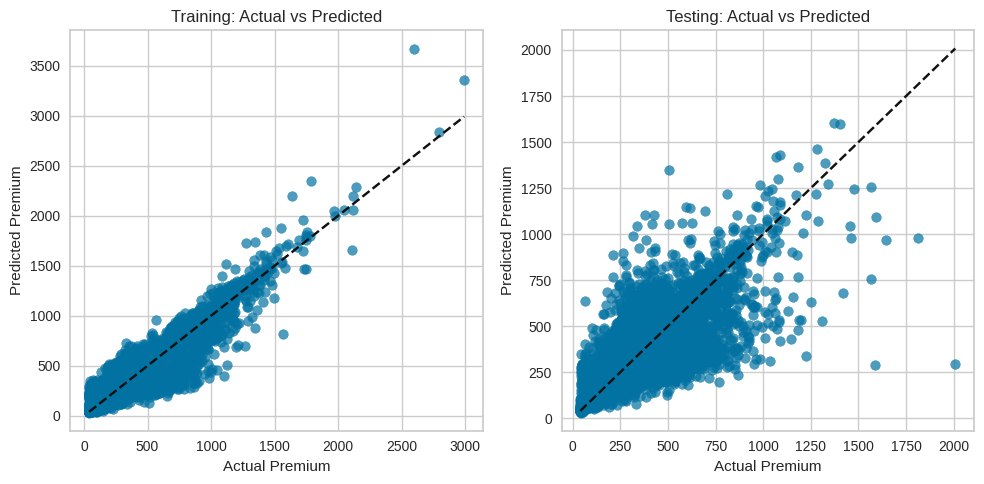

In [81]:
# To evaluate the TensorFlow Model
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Predictions
y_train_pred = model.predict(X1_train).flatten()
y_test_pred = model.predict(X1_test).flatten()

# Calculate Evaluation Metrics
train_mae = mean_absolute_error(y1train, y_train_pred)
train_mse = mean_squared_error(y1train, y_train_pred)
train_r2 = r2_score(y1train, y_train_pred)

test_mae = mean_absolute_error(y1_test, y_test_pred)
test_mse = mean_squared_error(y1_test, y_test_pred)
test_r2 = r2_score(y1_test, y_test_pred)

# Print Metrics
print(f"Training MAE: {train_mae:.2f}")
print(f"Training MSE: {train_mse:.2f}")
print(f"Training R²: {train_r2:.2f}")
print(f"Testing MAE: {test_mae:.2f}")
print(f"Testing MSE: {test_mse:.2f}")
print(f"Testing R²: {test_r2:.2f}")

# Plot Actual vs Predicted
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.scatter(y1train, y_train_pred, alpha=0.7)
plt.plot([min(y1train), max(y1train)], [min(y1train), max(y1train)], 'k--')
plt.xlabel("Actual Premium")
plt.ylabel("Predicted Premium")
plt.title("Training: Actual vs Predicted")

plt.subplot(1, 2, 2)
plt.scatter(y1_test, y_test_pred, alpha=0.7)
plt.plot([min(y1_test), max(y1_test)], [min(y1_test), max(y1_test)], 'k--')
plt.xlabel("Actual Premium")
plt.ylabel("Predicted Premium")
plt.title("Testing: Actual vs Predicted")

plt.tight_layout()
plt.show()

In [82]:
# MLP model
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.model_selection import GridSearchCV, train_test_split
mlp = MLPRegressor(hidden_layer_sizes=(128, 64, 32),
                   activation='relu',
                   max_iter=100,
                   random_state=42)

# Train the model
mlp.fit(X1_train, y1train)
'''param_grid = {
    'hidden_layer_sizes': [(50, 25), (64, 32), (100, 50), (100, 50, 25)],
    'activation': ['relu', 'tanh'],
    'solver': ['adam', 'sgd'],
    'alpha': [0.0001, 0.001],
    'learning_rate': ['constant', 'adaptive'],
    'batch_size': [64],
}
grid_search = GridSearchCV(mlp, param_grid, scoring='neg_mean_squared_error', cv=2, verbose=1)
grid_search.fit(xtrain, ytrain)
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_'''
y_train_pred = mlp.predict(X1_train)
y_test_pred = mlp.predict(X1_test)
train_mae = mean_absolute_error(y1train, y_train_pred)
test_mae = mean_absolute_error(y1_test, y_test_pred)
train_mse = mean_squared_error(y1train,y_train_pred)
test_mse = mean_squared_error(y1_test,y_test_pred)
test_r2 = r2_score(y1_test,y_test_pred)
train_r2 = r2_score(y1train,y_train_pred)
print(f'Training MAE: {train_mae:.4f}')
print(f'Testing MAE: {test_mae:.4f}')
print(f'Training MSE: {train_mse:.4f}')
print(f'Testing MSE: {test_mse:.4f}')
print(f'Testing R²: {test_r2:.4f}')
print(f'Training R²: {train_r2:.4f}')

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


Training MAE: 44.0253
Testing MAE: 46.7242
Training MSE: 5834.9258
Testing MSE: 6707.6559
Testing R²: 0.6526
Training R²: 0.7082


In [80]:
# XGB Model
from sklearn.linear_model import LinearRegression,Lasso
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
xgmodel0=XGBRegressor()
xgmodel0.fit(X1_train,y1train)
ypredtrain4=np.round(xgmodel0.predict(X1_train))
ypredtest4=np.round(xgmodel0.predict(X1_test))
print(r2_score(y1train,ypredtrain4))
print(r2_score(y1_test,ypredtest4))
#print(cross_val_score(xgmodel0,x1,y,cv=5,).mean())

# Hypertuning is not giving any better performance so it is avoided to save computational power
'''from sklearn.model_selection import GridSearchCV

estimator=XGBRegressor()
param_grid={'n_estimators':[50,100,150,200],'max_depth':[5,7,10],'gamma':[0,0.15,0.3,0.5,1],
            'learning_rate': [0.1, 0.01, 0.05], 'subsample':[0.6,0.7,0.75,0.8,0.85,0.9]}
grid3=GridSearchCV(estimator,param_grid,scoring="r2",cv=5)
grid3.fit(xtrain,ytrain)

print(grid3.best_params_)'''


ypredtrain4=xgmodel0.predict(X1_train)
ypredtest4=xgmodel0.predict(X1_test)



acc_xgb_Train = (r2_score(y1train,ypredtrain4))
print('R^2 Train:', acc_xgb_Train)

acc_xgb_Test = (r2_score(y1_test,ypredtest4))
print('R^2 Test:', acc_xgb_Test)

'''acc_xgb_CV = (cross_val_score(xgmodel,x1,y,cv=5,).mean())
print('R^2 CV:', acc_xgb_CV)'''


# other metrics
MAE_xgb_Train= mean_absolute_error(y1train,ypredtrain4)
print('MAE Train:',MAE_xgb_Train)
MSE_xgb_Train = mean_squared_error(y1train,ypredtrain4)
print('MSE Train:',MSE_xgb_Train)
MAE_xgb_Test= mean_absolute_error(y1_test,ypredtest4)
print('MAE:',MAE_xgb_Test)
MSE_xgb_Test = mean_squared_error(y1_test,ypredtest4)
print('MSE:',MSE_xgb_Test)
RMSE_xgb_Test = np.sqrt(mean_squared_error(y1_test,ypredtest4))
print('RMSE:', RMSE_xgb_Test)
MAPE_xgb_Test= (mean_absolute_percentage_error(y1_test,ypredtest4))
print('MAPE:',MAPE_xgb_Test)



0.767864108768521
0.659394561408897
R^2 Train: 0.7678694481319328
R^2 Test: 0.6593773503953815
MAE Train: 40.658848924947186
MSE Train: 4642.295322051874
MAE: 46.28214647405033
MSE: 6576.488093576697
RMSE: 81.09554916009075
MAPE: 0.16103240234228067


In [81]:
# RandomForest Model
import time
import psutil
from sklearn.linear_model import LinearRegression,Lasso
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
#from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
# Record the start time
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error



rfmodel0=RandomForestRegressor(random_state=41)
rfmodel0.fit(X1_train,y1train)
ypredtrain2=rfmodel0.predict(X1_train)
ypredtest2=rfmodel0.predict(X1_test)
print(r2_score(y1train,ypredtrain2))
print(r2_score(y1_test,ypredtest2))
#print(cross_val_score(rfmodel0,x1,y,cv=5,).mean())
'''
from sklearn.model_selection import GridSearchCV
estimator=RandomForestRegressor(random_state=41)
param_grid={'n_estimators':[60, 220, 40]}
grid1=GridSearchCV(estimator,param_grid,scoring="r2",cv=2)
grid1.fit(X1_train,y1train)
print(grid1.best_params_)

rfmodel=grid1
rfmodel.fit(X1_train,y1train)
ypredtrain2=rfmodel.predict(X1_train)
ypredtest2=rfmodel.predict(X1_test)
print(r2_score(y1train,ypredtrain2))
print(r2_score(y1_test,ypredtest2))
#print(cross_val_score(rfmodel,x1,y,cv=5,).mean())'''



acc_RF_Train = (r2_score(y1train,ypredtrain2))
print('R^2 Train:', acc_RF_Train)

acc_RF_Test = (r2_score(y1_test,ypredtest2))
print('R^2 Test:', acc_RF_Test)

'''acc_RF_CV = cross_val_score(rfmodel,x1,y,cv=5,).mean()
print('R^2 CV:', acc_RF_CV)'''


# other metrics

MAE_RF_Train= mean_absolute_error(y1train,ypredtrain2)
print('MAE Train:',MAE_RF_Train)
MSE_RF_Train = mean_squared_error(y1train,ypredtrain2)
print('MSE Train:',MSE_RF_Train)
MAE_RF_Test= mean_absolute_error(y1_test,ypredtest2)
print('MAE:',MAE_RF_Test)
MSE_RF_Test = mean_squared_error(y1_test,ypredtest2)
print('MSE:',MSE_RF_Test)
RMSE_RF_Test = np.sqrt(mean_squared_error(y1_test,ypredtest2))
print('RMSE:', RMSE_RF_Test)
MAPE_RF_Test= (mean_absolute_percentage_error(y1_test,ypredtest2))
print('MAPE:',MAPE_RF_Test)





0.9500552019320275
0.6505694612539943
R^2 Train: 0.9500552019320275
R^2 Test: 0.6505694612539943
MAE Train: 17.164845548884465
MSE Train: 998.8280326130983
MAE: 45.35465984739394
MSE: 6746.544248489217
RMSE: 82.13734989935588
MAPE: 0.1563170208801142


In [85]:
#print(cross_val_score(rfmodel0,X,y,cv=5,).mean())

In [82]:
#Now transform the whole dataset using the standardscaler for numerical values and OneHotEncoding for categorical values
X2 = preprocessor.fit_transform(X1)

In [ ]:
#print(cross_val_score(rfmodel0,X1,y,cv=5,).mean())

In [83]:
y_pred = rfmodel0.predict(X2)

# Convert predictions and actual values to a Pandas DataFrame
actual_vs_pred = np.column_stack((y, y_pred))
df_result = pd.DataFrame(actual_vs_pred, columns=['Actual', 'Predicted'])

# Calculate error metrics
df_result['Error'] = df_result['Actual'] - df_result['Predicted']
df_result['Absolute_Error'] = np.abs(df_result['Error'])

# Calculate threshold for outliers (mean + 2 standard deviations)
threshold = df_result['Absolute_Error'].mean() + 2 * df_result['Absolute_Error'].std()
outliers = df_result[df_result['Absolute_Error'] > threshold]

print("Outliers Detected:")
print(outliers)

Outliers Detected:
        Actual  Predicted     Error  Absolute_Error
68      318.97   467.8899 -148.9199        148.9199
69      571.49   429.8627  141.6273        141.6273
113     775.81   629.0434  146.7666        146.7666
143     240.72   376.2952 -135.5752        135.5752
151     484.31   357.9942  126.3158        126.3158
...        ...        ...       ...             ...
105496  764.38   639.8167  124.5633        124.5633
105501  611.79   411.4980  200.2920        200.2920
105514  752.45   335.9133  416.5367        416.5367
105531  177.60   348.3932 -170.7932        170.7932
105532  273.49   480.9493 -207.4593        207.4593

[4037 rows x 4 columns]


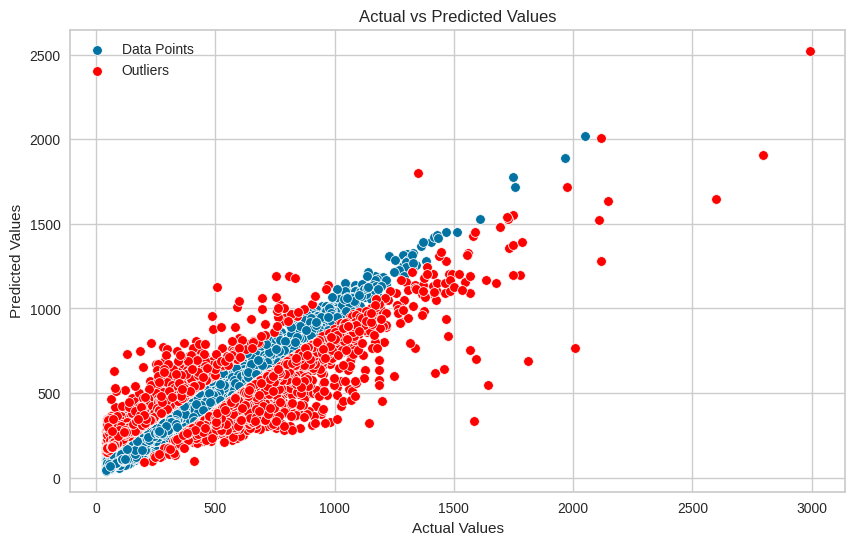

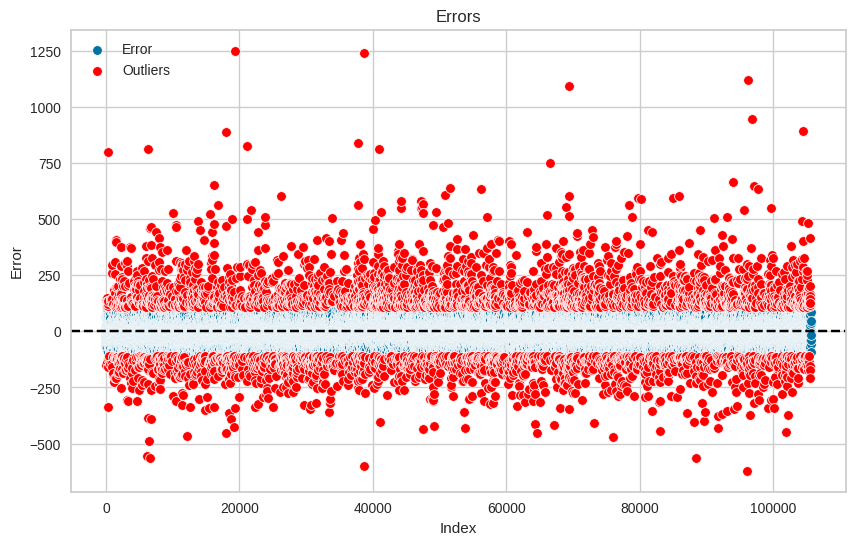

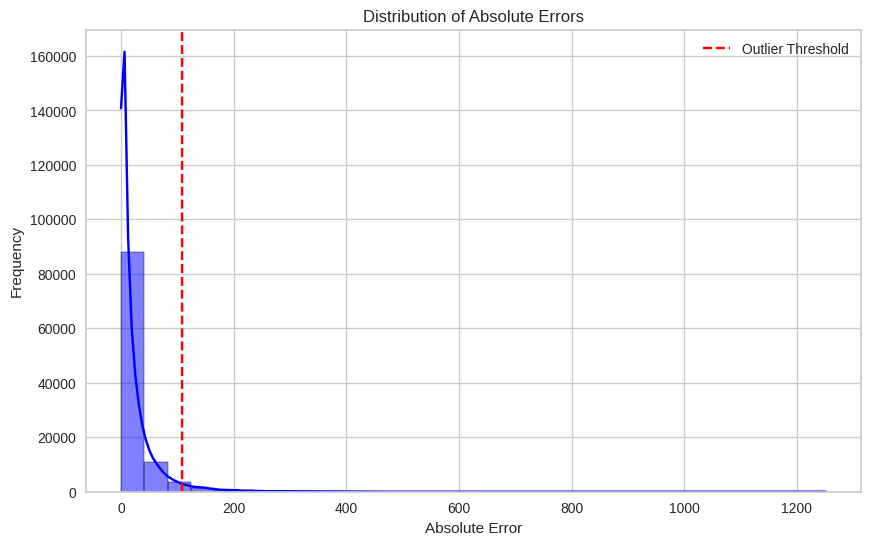

In [89]:
# Scatter Plot: Actual vs Predicted
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Actual', y='Predicted', data=df_result, label='Data Points')
sns.scatterplot(x='Actual', y='Predicted', data=outliers, color='red', label='Outliers')
plt.title('Actual vs Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()

# Error Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df_result.index, y='Error', data=df_result, label='Error')
sns.scatterplot(x=outliers.index, y='Error', data=outliers, color='red', label='Outliers')
plt.axhline(0, color='black', linestyle='--')
plt.title('Errors')
plt.xlabel('Index')
plt.ylabel('Error')
plt.legend()
plt.show()

# Histogram of Absolute Errors
plt.figure(figsize=(10, 6))
sns.histplot(df_result['Absolute_Error'], bins=30, kde=True, color='blue')
plt.axvline(threshold, color='red', linestyle='--', label='Outlier Threshold')
plt.title('Distribution of Absolute Errors')
plt.xlabel('Absolute Error')
plt.ylabel('Frequency')
plt.legend()
plt.show()

Deploy Models after outliers are removed

In [84]:
# Get the indices of outliers
outlier_indices = outliers.index

# Remove outliers from X and y
X_clean = X.drop(outlier_indices)
y_clean = y.drop(outlier_indices)

In [85]:
# Split the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X_clean, y_clean, test_size=0.2, random_state=46, shuffle=True)

In [86]:
# Now preprocess the train and test dataset Numerical with standardscaler and Categorical with OneHotEncoder
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

In [88]:
import tensorflow as tf
model1 = tf.keras.Sequential([
    tf.keras.layers.Dense(256, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])
model1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss='mean_squared_error',
              metrics=['mae'])

history = model1.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), verbose=2)

# Evaluate the Model
test_loss, test_mae = model1.evaluate(X_test, y_test, verbose=0)
print(f'Test MAE: {test_mae:.2f}')

Epoch 1/100
2538/2538 - 11s - loss: 6473.3921 - mae: 50.2942 - val_loss: 4035.6150 - val_mae: 40.0853 - 11s/epoch - 4ms/step
Epoch 2/100
2538/2538 - 11s - loss: 3960.0168 - mae: 39.8224 - val_loss: 3944.5874 - val_mae: 41.0502 - 11s/epoch - 4ms/step
Epoch 3/100
2538/2538 - 7s - loss: 3805.9258 - mae: 39.1402 - val_loss: 3753.0918 - val_mae: 39.0831 - 7s/epoch - 3ms/step
Epoch 4/100
2538/2538 - 6s - loss: 3719.7334 - mae: 38.5660 - val_loss: 3692.8894 - val_mae: 37.6238 - 6s/epoch - 3ms/step
Epoch 5/100
2538/2538 - 7s - loss: 3663.5955 - mae: 38.1366 - val_loss: 3693.8665 - val_mae: 37.7806 - 7s/epoch - 3ms/step
Epoch 6/100
2538/2538 - 6s - loss: 3606.0972 - mae: 37.8667 - val_loss: 3703.8716 - val_mae: 39.3302 - 6s/epoch - 2ms/step
Epoch 7/100
2538/2538 - 7s - loss: 3597.3384 - mae: 37.7296 - val_loss: 3607.9832 - val_mae: 37.6871 - 7s/epoch - 3ms/step
Epoch 8/100
2538/2538 - 6s - loss: 3549.1145 - mae: 37.6129 - val_loss: 3642.5103 - val_mae: 38.3387 - 6s/epoch - 2ms/step
Epoch 9/100


635/635 [==============================] - 1s 1ms/step
Training MAE: 27.14
Training MSE: 1757.95
Training R²: 0.88
Testing MAE: 40.21
Testing MSE: 4402.90
Testing R²: 0.72


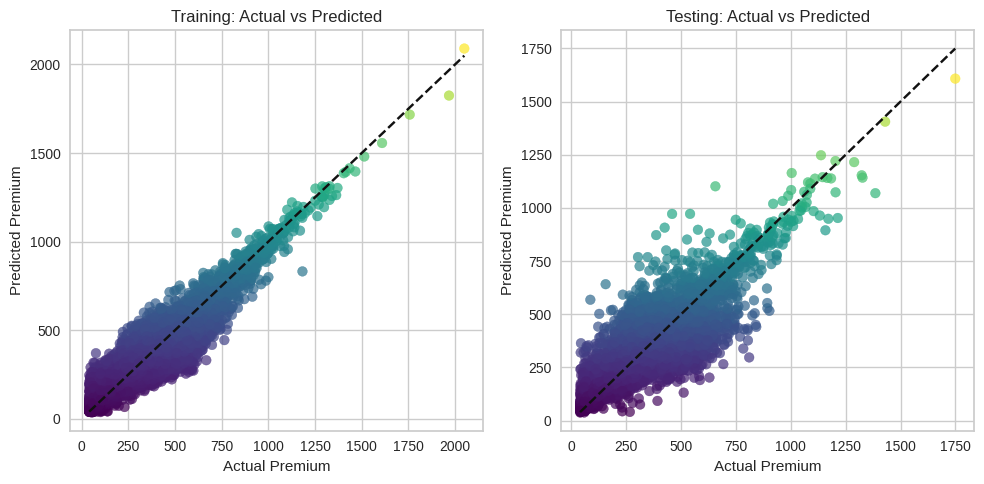

In [89]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Predictions
y_train_pred = model1.predict(X_train).flatten()
y_test_pred = model1.predict(X_test).flatten()

# Calculate Evaluation Metrics
train_mae = mean_absolute_error(y_train, y_train_pred)
train_mse = mean_squared_error(y_train, y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)

test_mae = mean_absolute_error(y_test, y_test_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

# Print Metrics
print(f"Training MAE: {train_mae:.2f}")
print(f"Training MSE: {train_mse:.2f}")
print(f"Training R²: {train_r2:.2f}")
print(f"Testing MAE: {test_mae:.2f}")
print(f"Testing MSE: {test_mse:.2f}")
print(f"Testing R²: {test_r2:.2f}")

# Plot Actual vs Predicted
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.scatter(y_train, y_train_pred, alpha=0.7,c=y_train_pred, cmap='viridis')
plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], 'k--')
plt.xlabel("Actual Premium")
plt.ylabel("Predicted Premium")
plt.title("Training: Actual vs Predicted")

plt.subplot(1, 2, 2)
plt.scatter(y_test, y_test_pred, alpha=0.7,c=y_test_pred, cmap='viridis')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'k--')
plt.xlabel("Actual Premium")
plt.ylabel("Predicted Premium")
plt.title("Testing: Actual vs Predicted")

plt.tight_layout()
plt.show()

In [90]:
# MLP Model
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.model_selection import GridSearchCV, train_test_split
mlp = MLPRegressor(hidden_layer_sizes=(128, 64, 32),
                   activation='relu',
                   max_iter=100,
                   random_state=42)

# Train the model
mlp.fit(X_train, y_train)
'''param_grid = {
    'hidden_layer_sizes': [(50, 25), (64, 32), (100, 50), (100, 50, 25)],
    'activation': ['relu', 'tanh'],
    'solver': ['adam', 'sgd'],
    'alpha': [0.0001, 0.001],
    'learning_rate': ['constant', 'adaptive'],
    'batch_size': [64],
}
grid_search = GridSearchCV(mlp, param_grid, scoring='neg_mean_squared_error', cv=2, verbose=1)
grid_search.fit(xtrain, ytrain)
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_'''
y_train_pred = mlp.predict(X_train)
y_test_pred = mlp.predict(X_test)
train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_test, y_test_pred)
train_mse = mean_squared_error(y_train,y_train_pred)
test_mse = mean_squared_error(y_test,y_test_pred)
test_r2 = r2_score(y_test,y_test_pred)
train_r2 = r2_score(y_train,y_train_pred)
print(f'Training MAE: {train_mae:.4f}')
print(f'Testing MAE: {test_mae:.4f}')
print(f'Training MSE: {train_mse:.4f}')
print(f'Testing MSE: {test_mse:.4f}')
print(f'Testing R²: {test_r2:.4f}')
print(f'Training R²: {train_r2:.4f}')

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


Training MAE: 34.9574
Testing MAE: 37.5303
Training MSE: 3092.6533
Testing MSE: 3580.4113
Testing R²: 0.7698
Training R²: 0.7957


In [91]:
# XGBoost Model
from sklearn.linear_model import LinearRegression,Lasso
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
xgmodel0=XGBRegressor()
xgmodel0.fit(X_train,y_train)
ypredtrain4=np.round(xgmodel0.predict(X_train))
ypredtest4=np.round(xgmodel0.predict(X_test))
print(r2_score(y_train,ypredtrain4))
print(r2_score(y_test,ypredtest4))

#X1 = preprocessor.fit_transform(X_clean)
#print(cross_val_score(xgmodel0,X1,y_clean,cv=3,).mean())
'''
from sklearn.model_selection import GridSearchCV

estimator=XGBRegressor()
param_grid={'n_estimators':[50,100,150,200],'max_depth':[5,7,10],'gamma':[0,0.15,0.3,0.5,1],
            'learning_rate': [0.1, 0.01, 0.05], 'subsample':[0.8,0.85,0.9]}
grid3=GridSearchCV(estimator,param_grid,scoring="r2",cv=5)
grid3.fit(X_train,y_train)

print(grid3.best_params_)


ypredtrain4=xgmodel0.predict(X_train)
ypredtest4=xgmodel0.predict(X_test)'''



acc_xgb_Train = (r2_score(y_train,ypredtrain4))
print('R^2 Train:', acc_xgb_Train)

acc_xgb_Test = (r2_score(y_test,ypredtest4))
print('R^2 Test:', acc_xgb_Test)

'''acc_xgb_CV = (cross_val_score(xgmodel,x1,y,cv=5,).mean())
print('R^2 CV:', acc_xgb_CV)'''


# other metrics
MAE_xgb_Train= mean_absolute_error(y_train,ypredtrain4)
print('MAE:',MAE_xgb_Train)
MSE_xgb_Train = mean_squared_error(y_train,ypredtrain4)
print('MSE:',MSE_xgb_Train)
RMSE_xgb_Train = np.sqrt(mean_squared_error(y_train,ypredtrain4))
print('RMSE:', RMSE_xgb_Train)
MAPE_xgb_Train= (mean_absolute_percentage_error(y_train,ypredtrain4))
print('MAPE:',MAPE_xgb_Train)

MAE_xgb_Test= mean_absolute_error(y_test,ypredtest4)
print('MAE:',MAE_xgb_Test)
MSE_xgb_Test = mean_squared_error(y_test,ypredtest4)
print('MSE:',MSE_xgb_Test)
RMSE_xgb_Test = np.sqrt(mean_squared_error(y_test,ypredtest4))
print('RMSE:', RMSE_xgb_Test)
MAPE_xgb_Test= (mean_absolute_percentage_error(y_test,ypredtest4))
print('MAPE:',MAPE_xgb_Test)



0.8279415411785129
0.7685784075176529
R^2 Train: 0.8279415411785129
R^2 Test: 0.7685784075176529
MAE: 32.41736190804541
MSE: 2605.1372743652573
RMSE: 51.04054539643221
MAPE: 0.1203665520950969
MAE: 37.32369680851064
MSE: 3598.7019030535857
RMSE: 59.98918155012273
MAPE: 0.13636290254786398


In [92]:
# RandomForest Model
from sklearn.linear_model import LinearRegression,Lasso
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
#from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
# Record the start time
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error



rfmodel0=RandomForestRegressor(random_state=41)
rfmodel0.fit(X_train,y_train)
ypredtrain2=rfmodel0.predict(X_train)
ypredtest2=rfmodel0.predict(X_test)
print(r2_score(y_train,ypredtrain2))
print(r2_score(y_test,ypredtest2))
'''X1 = preprocessor.fit_transform(X_clean)
print(cross_val_score(rfmodel0,X1,y_clean,cv=3,).mean())

from sklearn.model_selection import GridSearchCV
estimator=RandomForestRegressor(random_state=41)
param_grid={'n_estimators':[60, 220, 40]}
grid1=GridSearchCV(estimator,param_grid,scoring="r2",cv=3)
grid1.fit(X_train,y_train)
print(grid1.best_params_)

rfmodel=grid1
rfmodel.fit(X_train,y_train)
ypredtrain2=rfmodel.predict(X_train)
ypredtest2=rfmodel.predict(X_test)
print(r2_score(y_train,ypredtrain2))
print(r2_score(y_test,ypredtest2))

print(cross_val_score(rfmodel,X1,y_clean,cv=5,).mean())'''



acc_RF_Train = (r2_score(y_train,ypredtrain2))
print('R^2 Train:', acc_RF_Train)

acc_RF_Test = (r2_score(y_test,ypredtest2))
print('R^2 Test:', acc_RF_Test)

#acc_RF_CV = cross_val_score(rfmodel,X1,y_clean,cv=5,).mean()
#print('R^2 CV:', acc_RF_CV)


# other metrics
MAE_RF_Train= mean_absolute_error(y_train,ypredtrain2)
print('MAE:',MAE_RF_Train)
MSE_RF_Train = mean_squared_error(y_train,ypredtrain2)
print('MSE:',MSE_RF_Train)
RMSE_RF_Train = np.sqrt(mean_squared_error(y_train,ypredtrain2))
print('RMSE:', RMSE_RF_Train)
MAPE_RF_Train= (mean_absolute_percentage_error(y_train,ypredtrain2))
print('MAPE:',MAPE_RF_Train)

MAE_RF_Test= mean_absolute_error(y_test,ypredtest2)
print('MAE:',MAE_RF_Test)
MSE_RF_Test = mean_squared_error(y_test,ypredtest2)
print('MSE:',MSE_RF_Test)
RMSE_RF_Test = np.sqrt(mean_squared_error(y_test,ypredtest2))
print('RMSE:', RMSE_RF_Test)
MAPE_RF_Test= (mean_absolute_percentage_error(y_test,ypredtest2))
print('MAPE:',MAPE_RF_Test)




0.9676378171982971
0.7732772414155535
R^2 Train: 0.9676378171982971
R^2 Test: 0.7732772414155535
MAE: 13.297604787176034
MSE: 489.99583789140524
RMSE: 22.135849608528815
MAPE: 0.047800553740815266
MAE: 36.07132988152697
MSE: 3525.633083894901
RMSE: 59.377041724010645
MAPE: 0.13004463469769892


In [93]:
!pip install shap

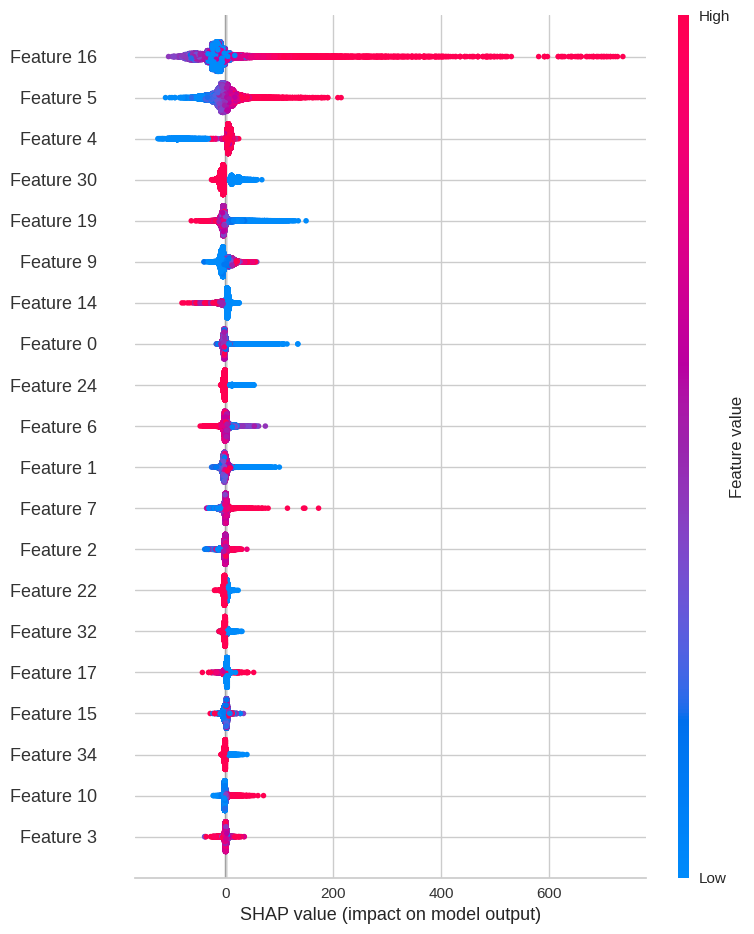

In [94]:
# Shap analysis for RF model
import shap
explainer3 = shap.TreeExplainer(xgmodel0)
XGB_shap_values = explainer3.shap_values(X_test)
shap.summary_plot(XGB_shap_values, X_test)

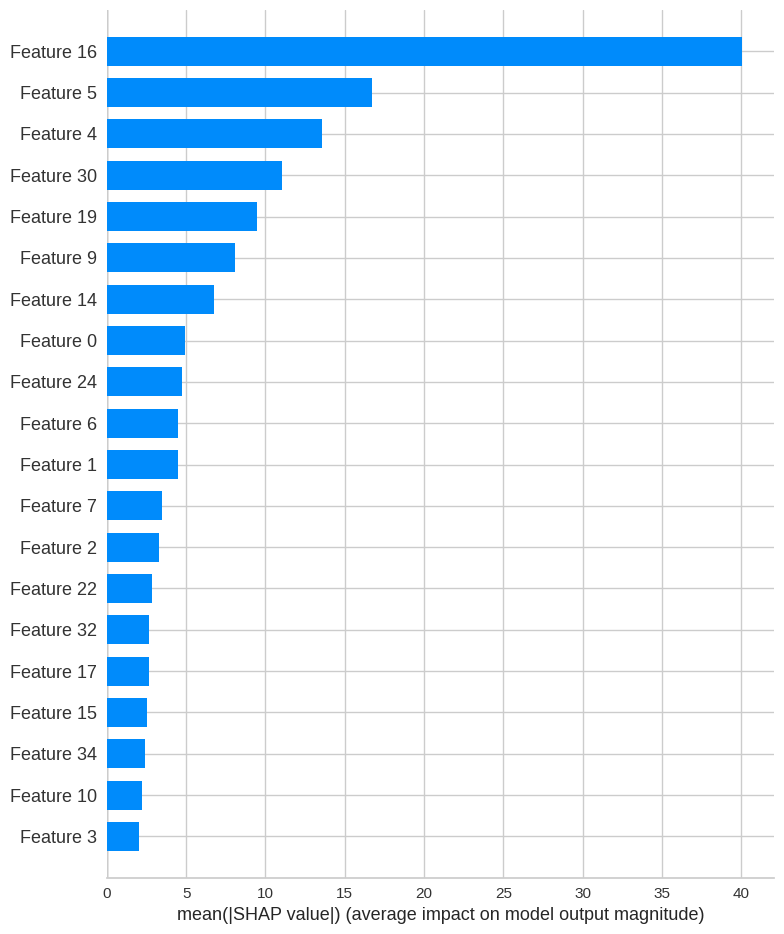

In [95]:
shap.summary_plot(XGB_shap_values, X_test, plot_type="bar")

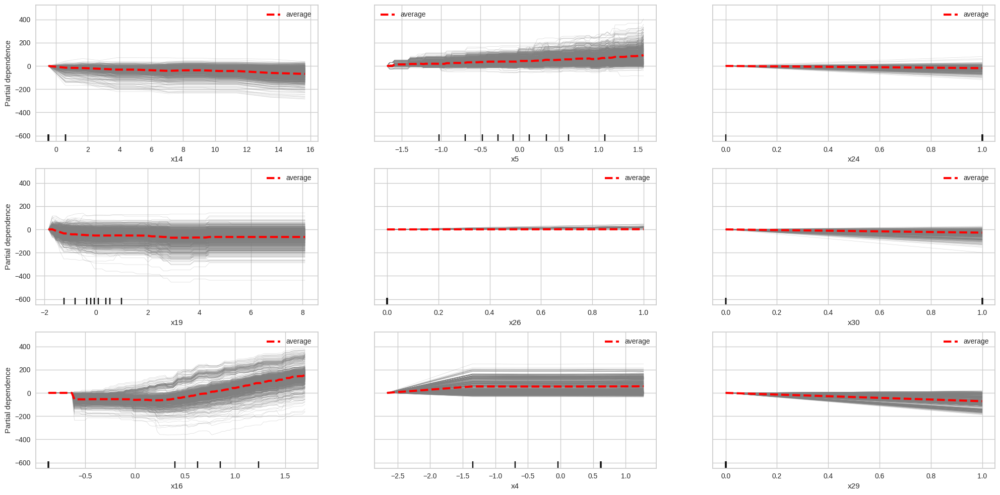

In [105]:
from sklearn.inspection import PartialDependenceDisplay
#cols = X_clean.columns
# Determine the 9 features with highest value for "feature importance" to draw the ICE plots.
included_features_indices = np.argpartition(xgmodel0.feature_importances_, -9)[-9:]

# Plot the ICE plots.
fig, ax = plt.subplots(figsize=(20, 10))
fig.set_tight_layout(True)  # Make sure labels of axes don't overlap in the final figure.
_ = PartialDependenceDisplay.from_estimator(estimator=xgmodel0,
                                            ax=ax,
                                            X=X_test,
                                            features=[i for i in included_features_indices],
                                            centered= True,
                                            n_cols=3,
                                            kind='both',
                                            ice_lines_kw={'color': 'gray'},
                                            pd_line_kw={'color': 'red', 'linewidth': 3, 'linestyle': 'dashed'})

## AIM 2: Create a Fraud detection Model

In [165]:
x.dtypes

ID                                     int64
Date_last_renewal             datetime64[ns]
Date_next_renewal             datetime64[ns]
Distribution_channel                 float64
Seniority                              int64
Policies_in_force                      int64
Max_policies                           int64
Max_products                           int64
Lapse                                  int64
Payment                                int64
Premium                              float64
Cost_claims_year                     float64
N_claims_year                          int64
N_claims_history                       int64
R_Claims_history                     float64
Type_risk                              int64
Area                                   int64
Second_driver                          int64
Year_matriculation                     int64
Power                                  int64
Cylinder_capacity                      int64
Value_vehicle                        float64
N_doors   

In [166]:
chance = x

In [167]:
print(chance)

           ID Date_last_renewal Date_next_renewal  Distribution_channel  \
0           1        2015-11-05        2016-11-05                   0.0   
1           1        2016-11-05        2017-11-05                   0.0   
2           1        2017-11-05        2018-11-05                   0.0   
3           1        2018-11-05        2019-11-05                   0.0   
4           2        2017-09-26        2018-09-26                   0.0   
...       ...               ...               ...                   ...   
105550  53498        2018-07-30        2019-07-30                   0.0   
105551  53499        2018-08-16        2019-08-16                   0.0   
105552  53500        2018-11-21        2019-11-21                   0.0   
105553  53501        2018-11-21        2019-11-21                   0.0   
105554  53502        2018-10-01        2019-10-01                   1.0   

        Seniority  Policies_in_force  Max_policies  Max_products  Lapse  \
0               4       

In [168]:
# Create a attribute is_claim to mark 1 for Claim happening in the year
chance['is_claim'] = (chance['Cost_claims_year'] != 0).astype(int)

In [169]:
print(chance[['Cost_claims_year', 'is_claim']])

        Cost_claims_year  is_claim
0                    0.0         0
1                    0.0         0
2                    0.0         0
3                    0.0         0
4                    0.0         0
...                  ...       ...
105550               0.0         0
105551               0.0         0
105552               0.0         0
105553               0.0         0
105554               0.0         0

[105555 rows x 2 columns]


In [170]:
# Split the data into Y for target variable
Y_chance = chance['is_claim']

In [171]:
Y_chance.head(40)

0     0
1     0
2     0
3     0
4     0
5     0
6     0
7     0
8     0
9     0
10    0
11    0
12    0
13    0
14    0
15    0
16    0
17    0
18    1
19    0
20    0
21    0
22    0
23    0
24    0
25    0
26    0
27    0
28    1
29    1
30    0
31    0
32    0
33    0
34    0
35    0
36    0
37    0
38    0
39    0
Name: is_claim, dtype: int64

In [172]:
chance.dtypes

ID                                     int64
Date_last_renewal             datetime64[ns]
Date_next_renewal             datetime64[ns]
Distribution_channel                 float64
Seniority                              int64
Policies_in_force                      int64
Max_policies                           int64
Max_products                           int64
Lapse                                  int64
Payment                                int64
Premium                              float64
Cost_claims_year                     float64
N_claims_year                          int64
N_claims_history                       int64
R_Claims_history                     float64
Type_risk                              int64
Area                                   int64
Second_driver                          int64
Year_matriculation                     int64
Power                                  int64
Cylinder_capacity                      int64
Value_vehicle                        float64
N_doors   

In [173]:
# Drop the attributes from the independent variable which will overfit the model deployed
chance1 = chance.drop(['is_claim','ID','Cost_claims_year','N_claims_history','N_claims_year'],axis=1)

In [174]:
chance1.head()

,Date_last_renewal,Date_next_renewal,Distribution_channel,Seniority,Policies_in_force,Max_policies,Max_products,Lapse,Payment,Premium,...,Weight,Age,Driving_since,Lapse_to_next_renewal_days,Premium_lag_1,Premium_lag_2,Year,Month,Year_last_renewal,vehicle_age
0,2015-11-05,2016-11-05,0.0,4,1,2,1,0,0,222.52,...,190,59,39,0.0,0.00,0.00,2016,11,2015,11
1,2016-11-05,2017-11-05,0.0,4,1,2,1,0,0,213.78,...,190,60,40,0.0,222.52,0.00,2017,11,2016,12
2,2017-11-05,2018-11-05,0.0,4,2,2,1,0,0,214.84,...,190,61,41,0.0,213.78,222.52,2018,11,2017,13
3,2018-11-05,2019-11-05,0.0,4,2,2,1,0,0,216.99,...,190,62,42,0.0,214.84,213.78,2019,11,2018,14
4,2017-09-26,2018-09-26,0.0,4,2,2,1,0,1,213.70,...,190,61,41,0.0,0.00,0.00,2018,9,2017,13


In [175]:
# Drop the attributes with date format from the dependent variable
chance1 = chance1.drop(['Date_next_renewal','Date_last_renewal','Year','Month','Year_last_renewal','Year_matriculation'],axis=1)

In [176]:
chance1.dtypes

Distribution_channel          float64
Seniority                       int64
Policies_in_force               int64
Max_policies                    int64
Max_products                    int64
Lapse                           int64
Payment                         int64
Premium                       float64
R_Claims_history              float64
Type_risk                       int64
Area                            int64
Second_driver                   int64
Power                           int64
Cylinder_capacity               int64
Value_vehicle                 float64
N_doors                         int64
Type_fuel                       int64
Length                        float64
Weight                          int64
Age                             int64
Driving_since                   int64
Lapse_to_next_renewal_days    float64
Premium_lag_1                 float64
Premium_lag_2                 float64
vehicle_age                     int64
dtype: object

In [178]:
chance1.dtypes

Distribution_channel          float64
Seniority                       int64
Policies_in_force               int64
Max_policies                    int64
Max_products                    int64
Lapse                           int64
Payment                         int64
Premium                       float64
R_Claims_history              float64
Type_risk                       int64
Area                            int64
Second_driver                   int64
Power                           int64
Cylinder_capacity               int64
Value_vehicle                 float64
N_doors                         int64
Type_fuel                       int64
Length                        float64
Weight                          int64
Age                             int64
Driving_since                   int64
Lapse_to_next_renewal_days    float64
Premium_lag_1                 float64
Premium_lag_2                 float64
vehicle_age                     int64
dtype: object

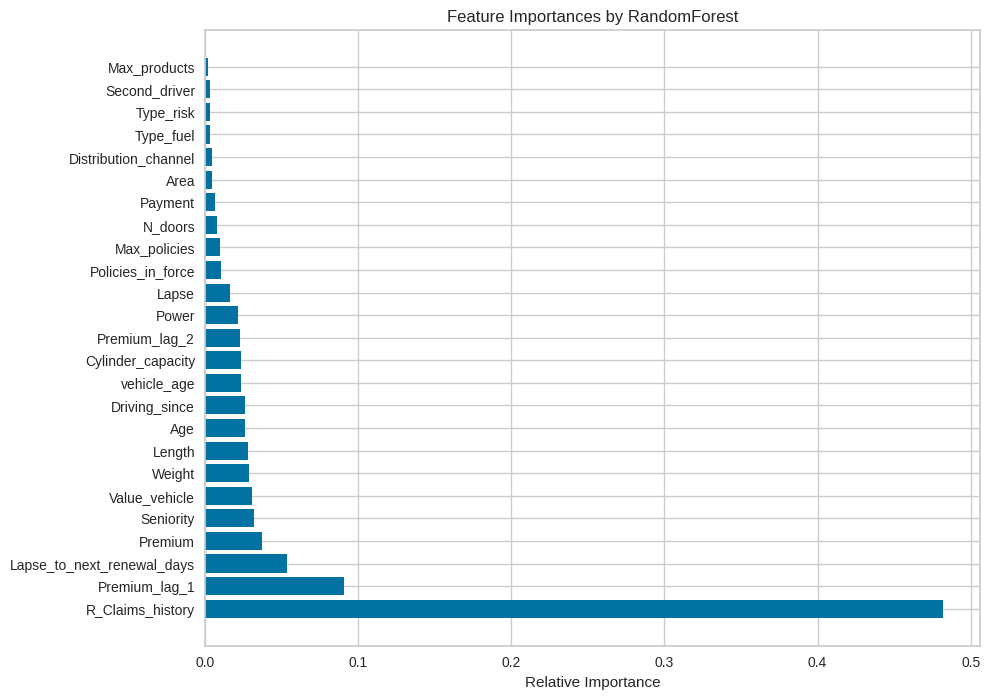

In [179]:
#using RandomForestClassifier and feature importance Plot the feature importance inthe model
from sklearn.ensemble import RandomForestClassifier

# Assuming X are your predictors and y is the target (claim_amount)
model = RandomForestClassifier()
model.fit(chance1, Y_chance)

# Get feature importances
importances = model.feature_importances_

# Plotting feature importances
indices = np.argsort(importances)[::-1]
plt.figure(figsize=(10, 8))
plt.title('Feature Importances by RandomForest')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [chance1.columns[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()


In [183]:
#Split the data into train and test
X_train1, X_test1, y_train1, y_test1 = train_test_split(chance1,Y_chance, test_size=0.2, random_state=44)
# using Minmax scale the data
from sklearn.preprocessing import MinMaxScaler

MM_scaler = MinMaxScaler()
MM_scaler.fit(X_train1)

X_train_scale = pd.DataFrame(MM_scaler.transform(X_train1),
                             index=X_train1.index,
                             columns=X_train1.columns)

X_test1 = pd.DataFrame(MM_scaler.transform(X_test1),
                             index=X_test1.index,
                             columns=X_test1.columns)

In [ ]:
X_train_scale.min(axis=0)

Distribution_channel          0.0
Seniority                     0.0
Policies_in_force             0.0
Max_policies                  0.0
Max_products                  0.0
Lapse                         0.0
Payment                       0.0
Premium                       0.0
N_claims_year                 0.0
N_claims_history              0.0
R_Claims_history              0.0
Type_risk                     0.0
Area                          0.0
Second_driver                 0.0
Power                         0.0
Cylinder_capacity             0.0
Value_vehicle                 0.0
N_doors                       0.0
Type_fuel                     0.0
Length                        0.0
Weight                        0.0
Age                           0.0
Driving_since                 0.0
Lapse_to_next_renewal_days    0.0
Premium_lag_1                 0.0
Premium_lag_2                 0.0
vehicle_age                   0.0
dtype: float64

In [ ]:
X_train_scale.max(axis=0)

Distribution_channel          1.0
Seniority                     1.0
Policies_in_force             1.0
Max_policies                  1.0
Max_products                  1.0
Lapse                         1.0
Payment                       1.0
Premium                       1.0
N_claims_year                 1.0
N_claims_history              1.0
R_Claims_history              1.0
Type_risk                     1.0
Area                          1.0
Second_driver                 1.0
Power                         1.0
Cylinder_capacity             1.0
Value_vehicle                 1.0
N_doors                       1.0
Type_fuel                     1.0
Length                        1.0
Weight                        1.0
Age                           1.0
Driving_since                 1.0
Lapse_to_next_renewal_days    1.0
Premium_lag_1                 1.0
Premium_lag_2                 1.0
vehicle_age                   1.0
dtype: float64

In [ ]:
X_test.min(axis=0)

Distribution_channel          0.000000
Seniority                     0.000000
Policies_in_force             0.000000
Max_policies                  0.000000
Max_products                  0.000000
Lapse                         0.000000
Payment                       0.000000
Premium                       0.000857
N_claims_year                 0.000000
N_claims_history              0.000000
R_Claims_history              0.000000
Type_risk                     0.000000
Area                          0.000000
Second_driver                 0.000000
Power                         0.000000
Cylinder_capacity             0.000000
Value_vehicle                -0.000950
N_doors                       0.000000
Type_fuel                     0.000000
Length                        0.000000
Weight                        0.000000
Age                           0.000000
Driving_since                 0.000000
Lapse_to_next_renewal_days    0.000000
Premium_lag_1                 0.000000
Premium_lag_2            

In [ ]:
X_test.max(axis=0)

Distribution_channel          1.000000
Seniority                     1.000000
Policies_in_force             0.800000
Max_policies                  1.000000
Max_products                  1.000000
Lapse                         0.714286
Payment                       1.000000
Premium                       0.822662
N_claims_year                 1.200000
N_claims_history              1.000000
R_Claims_history              0.800153
Type_risk                     1.500000
Area                          1.000000
Second_driver                 1.000000
Power                         1.057221
Cylinder_capacity             0.914498
Value_vehicle                 1.191722
N_doors                       1.000000
Type_fuel                     1.000000
Length                        0.789087
Weight                        0.894417
Age                           1.026667
Driving_since                 0.983333
Lapse_to_next_renewal_days    0.666971
Premium_lag_1                 0.551663
Premium_lag_2            

In [ ]:
# using the Lasso Regression and SelectFromModel identify the features with zero variance coefficient
from sklearn.linear_model import Lasso
from sklearn.feature_selection import SelectFromModel

# Establish the Lasso (L1) Regularisation model that will perform feature selection.
lasso = Lasso(alpha=5e-5, random_state=1, max_iter=int(1e+6)).fit(X_train_scale, y_train1)
model_L = SelectFromModel(lasso, prefit=True)

X_train_l1 = model_L.transform(X_train_scale)

selected_features = pd.DataFrame(model_L.inverse_transform(X_train_l1),
                                index=X_train_scale.index,
                                columns=X_train_scale.columns)

print(selected_features)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


        Distribution_channel  Seniority  Policies_in_force  Max_policies  \
104379                   0.0   0.025641             0.0000        0.0000   
31267                    0.0   0.076923             0.0000        0.0000   
48471                    1.0   0.051282             0.0625        0.0625   
7547                     1.0   0.102564             0.1250        0.1250   
75208                    0.0   0.025641             0.0625        0.0625   
...                      ...        ...                ...           ...   
53123                    0.0   0.153846             0.0000        0.0625   
49723                    0.0   0.051282             0.0625        0.0625   
25773                    0.0   0.128205             0.0000        0.0625   
69027                    1.0   0.153846             0.0000        0.0000   
14100                    1.0   0.153846             0.0625        0.0625   

        Max_products     Lapse  Payment   Premium  R_Claims_history  \
104379      0.00

In [ ]:
selected_columns = selected_features.columns[selected_features.var() != 0]

print(selected_columns)

Index(['Distribution_channel', 'Seniority', 'Policies_in_force',
       'Max_policies', 'Max_products', 'Lapse', 'Payment', 'Premium',
       'R_Claims_history', 'Type_risk', 'Area', 'Second_driver',
       'Cylinder_capacity', 'N_doors', 'Type_fuel', 'Driving_since',
       'Lapse_to_next_renewal_days', 'Premium_lag_1', 'Premium_lag_2',
       'vehicle_age'],
      dtype='object')


In [ ]:
#Drop the features with zero variance from train data
X_train_L2reg = selected_features.drop(selected_features.columns[selected_features.var() == 0], axis=1)

print(X_train_L2reg)

        Distribution_channel  Seniority  Policies_in_force  Max_policies  \
104379                   0.0   0.025641             0.0000        0.0000   
31267                    0.0   0.076923             0.0000        0.0000   
48471                    1.0   0.051282             0.0625        0.0625   
7547                     1.0   0.102564             0.1250        0.1250   
75208                    0.0   0.025641             0.0625        0.0625   
...                      ...        ...                ...           ...   
53123                    0.0   0.153846             0.0000        0.0625   
49723                    0.0   0.051282             0.0625        0.0625   
25773                    0.0   0.128205             0.0000        0.0625   
69027                    1.0   0.153846             0.0000        0.0000   
14100                    1.0   0.153846             0.0625        0.0625   

        Max_products     Lapse  Payment   Premium  R_Claims_history  \
104379      0.00

In [ ]:
# Select only the features with non zero variance
X_valid_L2reg = X_test1[selected_columns]

In [185]:
# RandomForestClassifier Model
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
random_search = {'criterion': ['entropy', 'gini'],
               'max_depth': [2,3,4,5,6,7,10],
               'min_samples_leaf': [4, 6, 8],
               'min_samples_split': [5, 7,10],
               'n_estimators': [300]}

clf1 = RandomForestClassifier()
Randmodel = RandomizedSearchCV(estimator = clf1, param_distributions = random_search, n_iter = 10,
                               cv = 2, verbose= 1, random_state= 101, n_jobs = -1)
Randmodel.fit(X_train_L2reg,y_train1)

Fitting 2 folds for each of 10 candidates, totalling 20 fits


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()
/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


RandomizedSearchCV(cv=2, estimator=RandomForestClassifier(), n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [2, 3, 4, 5, 6, 7, 10],
                                        'min_samples_leaf': [4, 6, 8],
                                        'min_samples_split': [5, 7, 10],
                                        'n_estimators': [300]},
                   random_state=101, verbose=1)

In [186]:
# Print the classification report on the X_Valid
y_pred12=Randmodel.predict(X_valid_L2reg)
print (classification_report(y_test1, y_pred12))

              precision    recall  f1-score   support

           0       0.95      0.96      0.96     17157
           1       0.83      0.78      0.81      3954

    accuracy                           0.93     21111
   macro avg       0.89      0.87      0.88     21111
weighted avg       0.93      0.93      0.93     21111



In [ ]:
#Scale the whole dataset to retreive the classification report based on its prediction and actual
from sklearn.preprocessing import MinMaxScaler

MM_scaler = MinMaxScaler()
MM_scaler.fit(chance1)

X_chance1 = pd.DataFrame(MM_scaler.transform(chance1),
                             index=chance1.index,
                             columns=chance1.columns)
from sklearn.linear_model import Lasso
from sklearn.feature_selection import SelectFromModel

# Establish the Lasso (L1) Regularisation model that will perform feature selection.
lasso = Lasso(alpha=5e-5, random_state=1, max_iter=int(1e+6)).fit(X_chance1, Y_chance)
modelL1 = SelectFromModel(lasso, prefit=True)

X_chance_l1 = modelL1.transform(X_chance1)

selected_features = pd.DataFrame(modelL1.inverse_transform(X_chance_l1),
                                index=X_chance1.index,
                                columns=X_chance1.columns)

print(selected_features)

selected_columns = selected_features.columns[selected_features.var() != 0]
X_chance_L1reg = selected_features.drop(selected_features.columns[selected_features.var() == 0], axis=1)

print(X_chance_L1reg)
print(selected_columns)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


        Distribution_channel  Seniority  Policies_in_force  Max_policies  \
0                        0.0   0.076923             0.0000        0.0625   
1                        0.0   0.076923             0.0000        0.0625   
2                        0.0   0.076923             0.0625        0.0625   
3                        0.0   0.076923             0.0625        0.0625   
4                        0.0   0.076923             0.0625        0.0625   
...                      ...        ...                ...           ...   
105550                   0.0   0.000000             0.0000        0.0000   
105551                   0.0   0.000000             0.0000        0.0000   
105552                   0.0   0.000000             0.0000        0.0000   
105553                   0.0   0.000000             0.0000        0.0000   
105554                   1.0   0.000000             0.0000        0.0000   

        Max_products  Lapse  Payment   Premium  R_Claims_history  Type_risk  \
0       

In [ ]:
y_pred22=Randmodel.predict(X_chance_L1reg)
print (classification_report(Y_chance, y_pred22))

              precision    recall  f1-score   support

           0       0.95      0.96      0.96     85909
           1       0.83      0.79      0.81     19646

    accuracy                           0.93    105555
   macro avg       0.89      0.88      0.88    105555
weighted avg       0.93      0.93      0.93    105555



## AIM 3: Predict the Claim Amount Range

In [187]:
chance.dtypes

ID                                     int64
Date_last_renewal             datetime64[ns]
Date_next_renewal             datetime64[ns]
Distribution_channel                 float64
Seniority                              int64
Policies_in_force                      int64
Max_policies                           int64
Max_products                           int64
Lapse                                  int64
Payment                                int64
Premium                              float64
Cost_claims_year                     float64
N_claims_year                          int64
N_claims_history                       int64
R_Claims_history                     float64
Type_risk                              int64
Area                                   int64
Second_driver                          int64
Year_matriculation                     int64
Power                                  int64
Cylinder_capacity                      int64
Value_vehicle                        float64
N_doors   

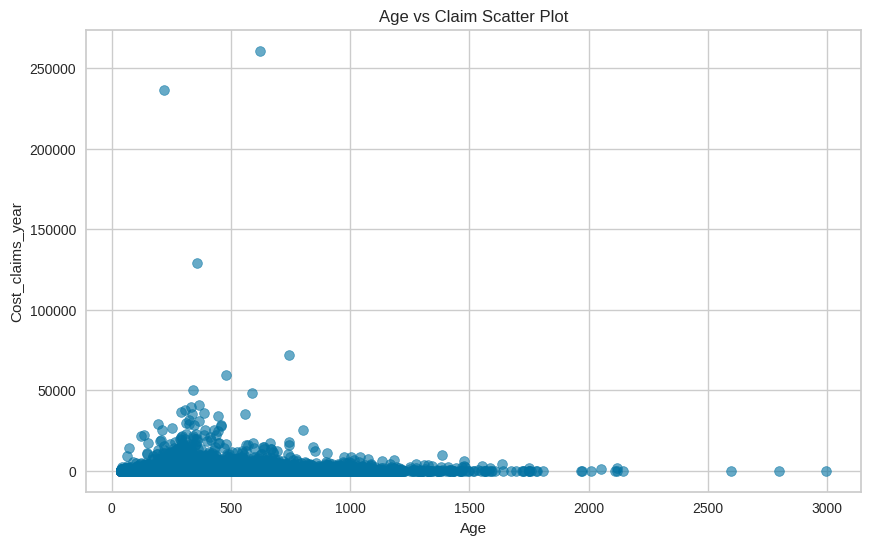

In [190]:
# Create a scatter plot Age Vs Cost_claims_year
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Premium', y='Cost_claims_year', data=chance, alpha=0.6, edgecolor=None)

plt.title('Age vs Claim Scatter Plot')
plt.xlabel('Age')
plt.ylabel('Cost_claims_year')
plt.show()


In [195]:
Claim_Data = chance

In [197]:
Claim_Data.dtypes

ID                                     int64
Date_last_renewal             datetime64[ns]
Date_next_renewal             datetime64[ns]
Distribution_channel                 float64
Seniority                              int64
Policies_in_force                      int64
Max_policies                           int64
Max_products                           int64
Lapse                                  int64
Payment                                int64
Premium                              float64
Cost_claims_year                     float64
N_claims_year                          int64
N_claims_history                       int64
R_Claims_history                     float64
Type_risk                              int64
Area                                   int64
Second_driver                          int64
Year_matriculation                     int64
Power                                  int64
Cylinder_capacity                      int64
Value_vehicle                        float64
N_doors   

In [198]:
#Filter the Claim data to select the data for which claim has been made
import pandas as pd

# Create a mask where 'N_claims_year' is not equal to zero
mask = Claim_Data['is_claim'] != 0

# Filter X_Claim using the mask
Claim_Data_filtered = Claim_Data[mask]



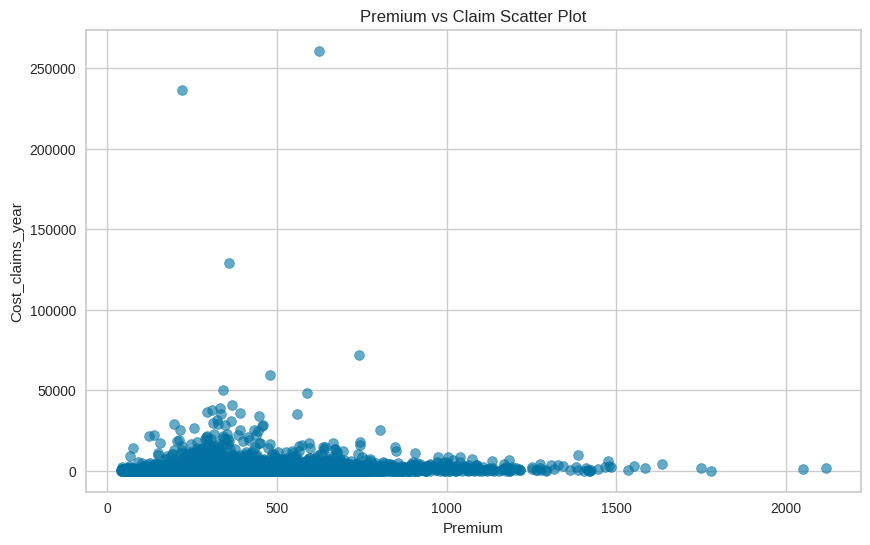

In [199]:
# Create a scatter plot Premium Vs Cost_claims_year
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Premium', y='Cost_claims_year', data=Claim_Data_filtered, alpha=0.6, edgecolor=None)

plt.title('Premium vs Claim Scatter Plot')
plt.xlabel('Premium')
plt.ylabel('Cost_claims_year')
plt.show()

In [200]:
# Create the bins
bin_edges = pd.cut(Claim_Data_filtered['Cost_claims_year'], bins=5, retbins=True)[1]  # Returns bin edges as well
Claim_Data_filtered['claim_amount_bin'] = pd.cut(Claim_Data_filtered['Cost_claims_year'], bins=bin_edges, include_lowest=True)

# Generate labels based on these bins
bin_labels = [f"{int(bin_edges[i])} - {int(bin_edges[i+1])}" for i in range(len(bin_edges)-1)]
Claim_Data_filtered['claim_amount_bin_labels'] = pd.cut(Claim_Data_filtered['Cost_claims_year'], bins=bin_edges, labels=bin_labels, include_lowest=True)

<ipython-input-200-8dbd7c852e64>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Claim_Data_filtered['claim_amount_bin'] = pd.cut(Claim_Data_filtered['Cost_claims_year'], bins=bin_edges, include_lowest=True)
<ipython-input-200-8dbd7c852e64>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Claim_Data_filtered['claim_amount_bin_labels'] = pd.cut(Claim_Data_filtered['Cost_claims_year'], bins=bin_edges, labels=bin_labels, include_lowest=True)


<ipython-input-201-392410a54b2f>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=Claim_Data_filtered, x='claim_amount_bin_labels', palette='viridis')


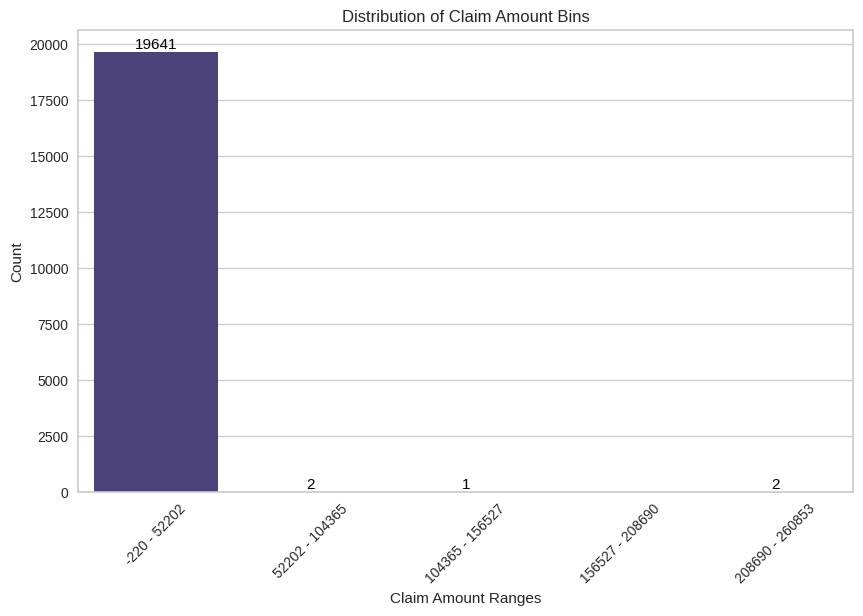

In [201]:
# Plot the Bins created showing how many observations are there in each.
plt.figure(figsize=(10, 6))
ax = sns.countplot(data=Claim_Data_filtered, x='claim_amount_bin_labels', palette='viridis')
plt.title('Distribution of Claim Amount Bins')
plt.xlabel('Claim Amount Ranges')
plt.ylabel('Count')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add counts above the bars
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                textcoords='offset points')

# Show the plot
plt.show()



In [202]:
print(Claim_Data_filtered)

           ID Date_last_renewal Date_next_renewal  Distribution_channel  \
18          7        2016-02-11        2017-02-11                   1.0   
28         12        2016-04-05        2017-04-05                   1.0   
29         12        2017-04-05        2018-04-05                   1.0   
46         18        2016-02-22        2017-02-22                   0.0   
65         28        2016-01-24        2017-01-24                   0.0   
...       ...               ...               ...                   ...   
105468  53429        2018-06-28        2019-06-28                   1.0   
105473  53432        2017-12-12        2018-12-12                   0.0   
105483  53441        2017-11-22        2018-11-22                   0.0   
105485  53442        2018-06-19        2019-06-19                   0.0   
105506  53459        2018-04-30        2019-04-30                   0.0   

        Seniority  Policies_in_force  Max_policies  Max_products  Lapse  \
18              3       

In [203]:
# Extract 'Low' range entries

low_label = bin_labels[0]
low_entries = Claim_Data_filtered[Claim_Data_filtered['claim_amount_bin_labels'] == low_label]

# Print some of the filtered data to verify
print(low_entries.head())
print("Number of entries classified as 'Low':", len(low_entries))



    ID Date_last_renewal Date_next_renewal  Distribution_channel  Seniority  \
18   7        2016-02-11        2017-02-11                   1.0          3   
28  12        2016-04-05        2017-04-05                   1.0          3   
29  12        2017-04-05        2018-04-05                   1.0          3   
46  18        2016-02-22        2017-02-22                   0.0         20   
65  28        2016-01-24        2017-01-24                   0.0          4   

    Policies_in_force  Max_policies  Max_products  Lapse  Payment  ...  \
18                  1             1             1      0        0  ...   
28                  1             1             1      0        1  ...   
29                  1             1             1      0        1  ...   
46                  1             2             1      0        1  ...   
65                  1             1             1      0        1  ...   

    Lapse_to_next_renewal_days  Premium_lag_1  Premium_lag_2  Year  Month  \
18 

In [204]:
print(low_entries.head())

    ID Date_last_renewal Date_next_renewal  Distribution_channel  Seniority  \
18   7        2016-02-11        2017-02-11                   1.0          3   
28  12        2016-04-05        2017-04-05                   1.0          3   
29  12        2017-04-05        2018-04-05                   1.0          3   
46  18        2016-02-22        2017-02-22                   0.0         20   
65  28        2016-01-24        2017-01-24                   0.0          4   

    Policies_in_force  Max_policies  Max_products  Lapse  Payment  ...  \
18                  1             1             1      0        0  ...   
28                  1             1             1      0        1  ...   
29                  1             1             1      0        1  ...   
46                  1             2             1      0        1  ...   
65                  1             1             1      0        1  ...   

    Lapse_to_next_renewal_days  Premium_lag_1  Premium_lag_2  Year  Month  \
18 

In [219]:
# Drop Id and attributes with date format and isclaim and Claim amount Bins
Claim = low_entries.drop(['ID','Date_last_renewal','Date_next_renewal','Year_matriculation','Year','Month','Year_last_renewal','claim_amount_bin','claim_amount_bin_labels','is_claim'],axis=1)

In [220]:
#Create a Cost_claims_bin of 50 bins
Claim['Cost_claims_bin'] = pd.cut(Claim['Cost_claims_year'], bins=50, labels=False)

Descriptive Statistics:
 count    19641.000000
mean       786.679278
std       1907.116669
min         40.050000
25%         95.650000
50%        289.180000
75%        882.000000
max      50101.940000
Name: Cost_claims_year, dtype: float64

Skewness: 9.773313415442338
Kurtosis: 147.03918028682529


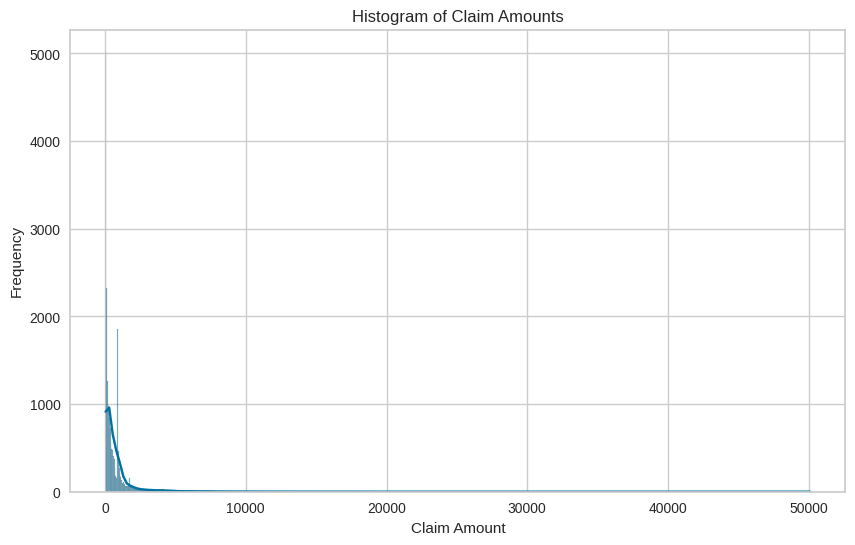

<ipython-input-226-4284e57fb425>:25: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(Claim['Cost_claims_year'], shade=True)


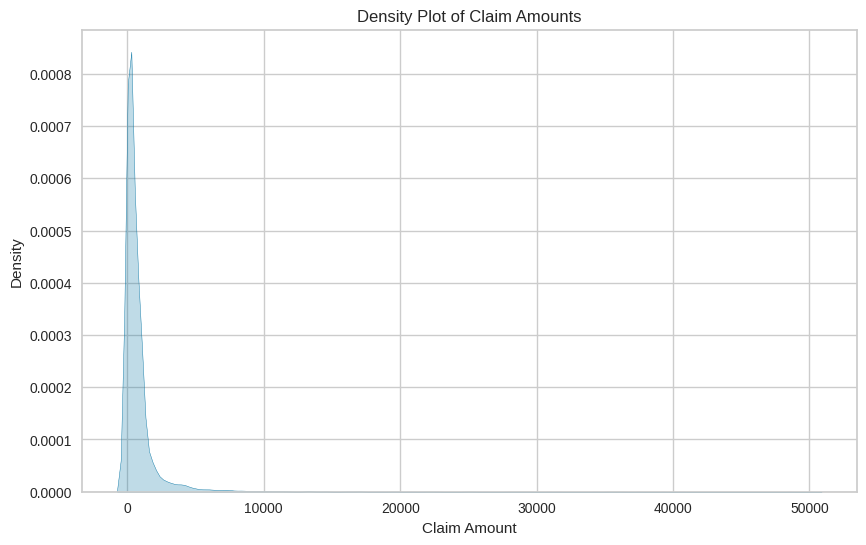

In [226]:
np.random.seed(0)
claim_amounts = np.random.exponential(scale=1000, size=1000)
df = pd.DataFrame({'claim_amount': claim_amounts})

# Descriptive statistics
desc_stats = Claim['Cost_claims_year'].describe()
skewness = Claim['Cost_claims_year'].skew()
kurtosis = Claim['Cost_claims_year'].kurtosis()

print("Descriptive Statistics:\n", desc_stats)
print("\nSkewness:", skewness)
print("Kurtosis:", kurtosis)

# Histogram
plt.figure(figsize=(10, 6))
sns.histplot(Claim['Cost_claims_year'], kde=True)
plt.title('Histogram of Claim Amounts')
plt.xlabel('Claim Amount')
plt.ylabel('Frequency')
plt.show()


# Density Plot
plt.figure(figsize=(10, 6))
sns.kdeplot(Claim['Cost_claims_year'], shade=True)
plt.title('Density Plot of Claim Amounts')
plt.xlabel('Claim Amount')
plt.ylabel('Density')
plt.show()



In [221]:
Xa = Claim.drop(['Cost_claims_year', 'Cost_claims_bin'], axis=1)
Ya = Claim['Cost_claims_bin']

In [222]:
#No Data augmentation
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import accuracy_score, classification_report
# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(Xa)

# Feature Selection using SelectFromModel with RandomForestRegressor
rf = RandomForestClassifier(random_state=42)
rf.fit(X_scaled, Ya)

# Use SelectFromModel to select important features
sfm = SelectFromModel(rf, threshold='mean')
sfm.fit(X_scaled, Ya)

# Get the selected features
selected_features = Xa.columns[sfm.get_support()]
X_selected = sfm.transform(X_scaled)

# Split the data into training and testing sets
X_train, X_test, Y_train, Y_test = train_test_split(X_selected, Ya, test_size=0.2, random_state=42)

# Train a RandomForestClassifier
rf_classifier = RandomForestClassifier(random_state=42)
rf_classifier.fit(X_train, Y_train)

# Predict the bins
Y_pred = rf_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(Y_test, Y_pred)
report = classification_report(Y_test, Y_pred)

print("Selected features:", selected_features)
print("Accuracy:", accuracy)
print("Classification Report:\n", report)

Selected features: Index(['Seniority', 'Premium', 'N_claims_year', 'N_claims_history',
       'R_Claims_history', 'Power', 'Cylinder_capacity', 'Value_vehicle',
       'Length', 'Weight', 'Age', 'Driving_since', 'vehicle_age'],
      dtype='object')
Accuracy: 0.8490710104352253
Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.99      0.92      3365
           1       0.04      0.00      0.01       305
           2       0.00      0.00      0.00        86
           3       0.00      0.00      0.00        56
           4       0.00      0.00      0.00        38
           5       0.00      0.00      0.00        23
           6       0.00      0.00      0.00        13
           7       0.00      0.00      0.00         6
           8       0.00      0.00      0.00         5
           9       0.00      0.00      0.00         5
          10       0.00      0.00      0.00         8
          11       0.00      0.00      0.00     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [223]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.preprocessing import StandardScaler
import numpy as np

# Assuming X and Y are defined from your dataset preprocessing

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(Xa)

# Feature Selection using SelectFromModel with RandomForestClassifier
rf = RandomForestClassifier(random_state=42)
sfm = SelectFromModel(rf, threshold='mean')
sfm.fit(X_scaled, Ya)

# Get the selected features
selected_features = Xa.columns[sfm.get_support()]
X_selected = sfm.transform(X_scaled)

# Identify and separate very small classes
class_counts = Ya.value_counts()
small_classes = class_counts[class_counts < 2].index
small_class_mask = Ya.isin(small_classes)

X_small_classes = X_selected[small_class_mask]
Y_small_classes = Ya[small_class_mask]

X_filtered = X_selected[~small_class_mask]
Y_filtered = Ya[~small_class_mask]

# Apply SMOTE to handle imbalanced data
smote = SMOTE(random_state=42, k_neighbors=1)
X_resampled, Y_resampled = smote.fit_resample(X_filtered, Y_filtered)

# Apply RandomUnderSampler to balance the data
rus = RandomUnderSampler(random_state=42)
X_resampled, Y_resampled = rus.fit_resample(X_resampled, Y_resampled)

# Combine resampled data with very small classes
X_final = np.vstack((X_resampled, X_small_classes))
Y_final = np.hstack((Y_resampled, Y_small_classes))

# Split the final dataset into training and testing sets
X_train, X_test, Y_train, Y_test = train_test_split(X_final, Y_final, test_size=0.2, random_state=42)





In [224]:
# After Data Augmentation
# Train a RandomForestClassifier on the resampled data
rf_classifier = RandomForestClassifier(random_state=42)
rf_classifier.fit(X_train, Y_train)

# Predict the bins
Y_pred = rf_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(Y_test, Y_pred)
report = classification_report(Y_test, Y_pred)

print("Selected features:", selected_features)
print("Accuracy:", accuracy)
print("Classification Report:\n", report)

Selected features: Index(['Seniority', 'Premium', 'N_claims_year', 'N_claims_history',
       'R_Claims_history', 'Power', 'Cylinder_capacity', 'Value_vehicle',
       'Length', 'Weight', 'Age', 'Driving_since', 'vehicle_age'],
      dtype='object')
Accuracy: 0.996390549022128
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.96      0.95      3307
           1       0.97      0.97      0.97      3236
           2       1.00      0.99      0.99      3458
           3       1.00      1.00      1.00      3278
           4       1.00      1.00      1.00      3382
           5       1.00      1.00      1.00      3376
           6       1.00      1.00      1.00      3249
           7       1.00      1.00      1.00      3276
           8       1.00      1.00      1.00      3351
           9       1.00      1.00      1.00      3357
          10       1.00      1.00      1.00      3395
          11       1.00      1.00      1.00      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
